In [1]:
#Math librairies
import numpy as np
from tqdm import tqdm
from scipy.interpolate import CubicSpline
from scipy.signal import argrelextrema
import math

#Astro libraries
import astropy.units as u
import astropy.constants as c

from colossus.cosmology import cosmology
from colossus.halo import profile_nfw
cosmo = cosmology.setCosmology('planck18') 
print (cosmo.h)

#Plotting libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm 
import matplotlib.colors as colors

from scipy.ndimage.filters import gaussian_filter

from PIL import Image
from PIL import ImageChops

import os


0.6766


/tmp/ipykernel_902/1781206311.py:23: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


## Simulation parameters

In [3]:
#Time parameters
t         = 0      # current time of the simulation

tEnd      = 12  # time at which simulation ends (Gyr)
dt        = .01    # timestep

T=np.linspace(t, tEnd, int(tEnd / dt) +1) #list contaning all time values
T=np.array(T)

#Hernquist softening length (Mpc)
softening = 15

G = 43007 # Gravitational constant in appropriate units

# Local group size in kpc
local_group = 562

# Functions 

## Cinematics functions

In [4]:
def getAcc(pos, mass, G, softening ):
    """
    Calculate the acceleration on each particle due to Newton's Law 
    pos  is an N x 3 matrix of positions
    mass is an N x 1 vector of masses
    a is N x 3 matrix of accelerations
    """
    # positions r = [x,y,z] for all particles
    x = pos[:,0:1]
    y = pos[:,1:2]
    z = pos[:,2:3]

    # matrix that stores all pairwise particle separations: r_j - r_i
    dx = x.T - x
    dy = y.T - y
    dz = z.T - z

    # matrix that stores 1/r^3 for all particle pairwise particle separations 
    inv_r3 = (dx**2 + dy**2 + dz**2 + softening**2)
    inv_r3[inv_r3>0] = inv_r3[inv_r3>0]**(-1.5)

    ax = G * (dx * inv_r3) @ mass
    ay = G * (dy * inv_r3) @ mass
    az = G * (dz * inv_r3) @ mass

    # pack together the acceleration components
    a = np.hstack((ax,ay,az))

    return a

In [5]:
def DynamicalFriction(pos, mass, vel, con,  G):
    N = len(mass)
    friction = np.zeros((N,3), dtype='float')
    
    # Precompute scale radii and host profiles
    r_s_values = np.zeros(N)
    rho_values = np.zeros(N)
    sigma_values = np.zeros(N)
    epsilon_values = np.zeros(N)
    for i in range(N):
        if mass[i] > 0:
            
            r_s_values[i] = profile_nfw.NFWProfile.nativeParameters(M=mass[i] * 1.e10 * cosmo.h, c=10.0, z=0.0, mdef='200c')[1]/cosmo.h
            if r_s_values[i] > 8.0:   # this comes from https://academic.oup.com/mnras/article/461/2/2212/2608460#equ7
                epsilon_values[i] = 2.2 * r_s_values[i] - 14
            else:
                epsilon_values[i] = 0.45 * r_s_values[i]
    
            r_s = r_s_values[i]
            for j in range(N):
                if (i != j) and mass[i] > 0 and mass[j] > 0 and mass[j] > mass[i]:
                    dr = pos[i] - pos[j]
                    r = np.linalg.norm(dr)
                
                    
                    if r < r_s_values[j]*10.0:  # this can be changed to r_200 later, but should be close
                        if rho_values[j] == 0:
                            profile_host = profile_nfw.NFWProfile(M=mass[j] * 1.e10 * cosmo.h, c=con[i], z=0.0, mdef='200c') # this assumes mass in solar masses
                            rho_values[j] = profile_host.density(r * cosmo.h) / 1.e10 * cosmo.h**2
                            v_max = profile_host.Vmax()[0]
                            sigma_values[j] = v_max * 1.4393 * (r / r_s)**0.354 / (1 + 1.1756 * (r / r_s)**0.725)
                        
                        rho = rho_values[j]
                        sigma = sigma_values[j]
                    
                        
                        dv = vel[i] - vel[j]
                        v = np.linalg.norm(dv)
                        x = v / np.sqrt(2 * sigma**2)
                        gamma = r / epsilon_values[i]
                        
                        fricmag = 4.0 * np.pi * G**2 * math.log(gamma) * mass[i] * rho / max(v, 50)**3 * (math.erf(x) - 2 * x * math.exp(-x**2) / np.sqrt(np.pi))
                        friction[i] -= dv * fricmag * mass[j] / (mass[i] + mass[j])
                        friction[j] += dv * fricmag * mass[i] / (mass[i] + mass[j])
    return friction



In [6]:
def OrbitIntegration(positions, velocities, masses) : 
    
    # Convert to Center-of-Mass frame
    velocities -= np.mean(masses * velocities,0) / np.mean(masses)

    # calculate initial gravitational accelerations

    acc = getAcc( positions, masses, G, softening )
    fric = DynamicalFriction(positions, masses, velocities, G)


    # number of timesteps
    Nt = int(np.ceil(tEnd/dt))

    # save particle orbits for plotting trails
    pos_save = np.zeros((N,3,Nt+1))
    pos_save[:,:,0] = positions

    exists_save = np.ones((N,Nt+1))

    vel_save = np.zeros((N,3,Nt+1))
    vel_save[:,:,0] = velocities     

    mass_save=np.zeros((N,Nt+1))
    mass_save[:,0]=np.linalg.norm(masses,axis=1)


    t_all = np.arange(Nt+1)*dt

    acc_save = np.zeros((N,Nt+1))
    fric_save = np.zeros((N,Nt+1))


    acc_save[:,0] = np.linalg.norm(acc, axis=1)
    fric_save[:,0] = np.linalg.norm(fric, axis=1)

    t=0

    # Simulation Main Loop = Leapfrog integration for N galaxies 
    #   00   *ribbit*
    #  (--)
    # ( || )
    # ^^~~^^

    for i in range(Nt):
        
        # (1/2) kick
        velocities += (acc + fric) * dt /2.0

        # drift
        positions += velocities * dt

        # update accelerations
        acc = getAcc( positions, masses, G, softening )

        # update dynamical friction
        fric = DynamicalFriction(positions, masses, velocities, G)
        
        # (1/2) kick
        velocities += (acc + fric) * dt/2.0

        # update time
        t += dt

        # save positions for plotting trail
        pos_save[:,:,i+1] = positions
        mass_save[:,i+1]=np.linalg.norm(masses, axis=1)
        acc_save[:,i+1] = np.linalg.norm(acc, axis=1)
        fric_save[:,i+1] = np.linalg.norm(fric, axis=1)


        # merging condition

        for l in range(N):
            for m in range(N):

                if l != m :
                    if np.linalg.norm(positions[l,:]-positions[m,:], axis=0) < 10 :

                        if masses[l] > masses[m] :
                            remove = m
                            keep = l
                        else:
                            remove = l
                            keep = m

                        if exists_save[remove,i] > 0:

                            print('Galaxy '+str(remove)+' has merged with galaxy '+ str(keep) +' at',t,'Gyr')

                            if remove==1 and keep==0:
                                t_merge=t 
                                b=10
                           
                            positions[keep] = (masses[keep] * positions[keep] + masses[remove] * positions[remove] ) / (masses[keep] + masses[remove] )
                            velocities[keep] = (masses[keep] * velocities[keep] + masses[remove] * velocities[remove] ) / (masses[keep] + masses[remove] )

                            masses[keep]=masses[keep]+masses[remove]
                            masses[remove]=[0]
                            exists_save[remove,i:-1] = 0


    # Calculating impact parameter :

    r_M31 = np.linalg.norm(pos_save[1,:,:]-pos_save[0,:,:],axis=0)




    # Find the merger index. Also set the distances to -1 after the merger of one of the pairs:

    b_M31_MW_array = np.ones(N) * 800.       # first minimum of the distance
    rmin_M31_MW_array = np.ones(N) * 800.    # minimum of the distance
    t_b_M31_MW_array = np.ones(N) * 11.      # time of first minimum of the distance
    t_m_M31_MW_array = np.ones(N) * 11.      # time of merger [default = 11]




    merged = np.where((exists_save[1,:] == 0) | (exists_save[0,:] == 0) )[0] # either the MW or the M31 no longer exist 
    r_M31[merged] = np.ones(len(merged)) * -1

    minima = argrelextrema(r_M31[:], np.less)[0]
    rmin_M31_MW_array = np.min(r_M31[r_M31[:] > 0] )
        
    if len(merged) > 0: # a merger has happened.
        t_m_M31_MW_array = t_all[merged[0]]
            
    if len(minima) > 0: # there is at least one local minimum
        b_M31_MW_array= r_M31[minima[0]]
        t_b_M31_MW_array = t_all[minima[0]]
    else:               # if there is no local mininum, but a merger has happened, we use b=10 and the time of the merger
        if len(merged) > 0:
            b_M31_MW_array= 10. 
            t_b_M31_MW_array = t_all[merged[0]]

    b=b_M31_MW_array


    time=t_b_M31_MW_array 


    print ("b MW - M31:", b_M31_MW_array)
    print( 't =', t_b_M31_MW_array)

 
    times_MW = np.where(exists_save[0,:-1] > 0)[0]
    times_M31 = np.where(exists_save[1,:-1] > 0)[0]


    # Velocities check

    v=np.dot((vel_save[0,:,0] - vel_save[1,:,0]), (vel_save[0,:,0] - vel_save[1,:,0]))**.5
    print('Total velocity=', v, 'km/s')

    vr=np.dot((vel_save[0,:,0]-vel_save[1,:,0]),(pos_save[0,:,0]-pos_save[1,:,0]))/r_M31[0]
    print('Radial velocity=', vr, 'km/s')

    vt = (v**2-vr**2)**(1/2)
    print('Transverse velocity=', vt, 'km/s')

    

            
    return positions, velocities, masses, acc_save, fric_save, exists_save, t_all, r_M31, b, time, v, vr, vt, times_M31

In [33]:
def print_variable(variable):
    variable_name = [name for name, value in globals().items() if value is variable][0]
    print(f"Variable: {variable_name}")


def statistics(name) :
    print('-------------------------------------------------------------------------------------------')
    print_variable(name)
    print('mean=', np.mean(name))
    print('median=',np.median(name))
    print('standard deviation=',np.std(name))
    print('-1 sigma=',np.median(name) - np.percentile(name, 15.8))
    print('1 sigma=', np.percentile(name, 84.5) - np.median(name))

## Loading galaxies from simulations and choice of galaxies functions

In [7]:
def LoadData(f):

    #Masses

    massMW=np.array([f['massMW']])/10**10*u.Msun
    massMW=massMW.value
    massM31=np.array([f['massM31']])/10**10*u.Msun
    massM31=massM31.value
    mass=f['mass'][0]/10**10*u.Msun
    mass=mass.value


    #Velocities in galactocentric frame (km/s)

    velMW=f['velMW']-f['velMW']
    velM31=f['velM31']-f['velMW']
    vel=f['vel'][0]-f['velMW']

    #Coordinates in Galactocentric frame (kpc)

    coordsMW=(f['coordsMW']-f['coordsMW'])*1000
    coordsM31=(f['coordsM31']-f['coordsMW'])*1000
    coords=(f['coords'][0]-f['coordsMW'])*1000

    print('Number of galaxies in the simulation :' , len(mass))

    return massMW, massM31, mass, velMW, velM31, vel, coordsMW, coordsM31, coords

In [8]:
def Galaxy_Selection(massMW, massM31, mass, velMW, velM31, vel, coordsMW, coordsM31, coords) :

    #Center of mass frame

    coords_cm = (massMW * coordsMW + massM31 * coordsM31 ) / (massMW + massM31 )

    #Initializing lists

    keep_coo=[]
    keep_coo_max=[]
    keep_vel=[]
    keep_vel_max=[]

    keep_mass=[]
    keep_mass_index=[]
    keep_mass_max=[]

    sum_mass=0

    # Keeping only the galaxies inside of the local group

    for i in range (len(mass)):
        
        if np.linalg.norm(coords[i,:]- coords_cm[0,:], axis=0) < local_group :
            keep_coo.append(coords[i])
            keep_vel.append(vel[i])
            keep_mass.append(np.array([mass[i]]))
            keep_mass_index.append(mass[i])
        
    keep_mass_index = np.array(keep_mass_index)

    print('Number of galaxies kept in the local group : ', len(keep_mass))

    #Keeping only the N most massive galaxies. N is the number of galaxies wished in total.

    top_mass_indices = np.argsort(keep_mass_index)[::-1][:N] #keeps the indices of the most massive galaxies

    for j in range (N): 
        
        index = top_mass_indices[j]

        sum_mass=sum_mass+keep_mass[index]

        keep_mass_max.append(keep_mass[index])
        keep_coo_max.append(keep_coo[index])
        keep_vel_max.append(keep_vel[index])

    print('Number of galaxies kept after mass selection : ', len(keep_mass_max))
    print('M31 is the most massive halo', keep_mass_max[0]==massM31)
    print('MW is the second most massive halo', keep_mass_max[1]==massMW)

    # Arrays of positions, velocities and masses for all galaxies

    positions=np.array(keep_coo_max)
    velocities=np.array(keep_vel_max)
    masses=np.array(keep_mass_max)

    return positions, velocities, masses, keep_mass_max, sum_mass

In [9]:
def execution(f) :

    massMW, massM31, mass, velMW, velM31, vel, coordsMW, coordsM31, coords = LoadData(f)

    positions, velocities, masses, keep_mass_max, sum_mass = Galaxy_Selection(massMW, massM31, mass, velMW, velM31, vel, coordsMW, coordsM31, coords)

    positions, velocities, masses, acc_save, fric_save, exists_save, t_all, r_M31, b, t,v, vr, vt, times_M31 = OrbitIntegration(positions, velocities, masses)
    return positions, velocities, masses, t_all, r_M31, b, t, keep_mass_max, times_M31, sum_mass, vr, vt

# One file test

2
Number of galaxies in the simulation : 89117
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.489999999999863 Gyr
b MW - M31: 12.04811678202123
t = 3.22
Total velocity= 130.57795514522425 km/s
Radial velocity= -129.5186200764441 km/s
Transverse velocity= 16.5990789925804 km/s
3
Number of galaxies in the simulation : 89117
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.479999999999864 Gyr
b MW - M31: 13.050530176800468
t = 3.18
Total velocity= 130.57795516058926 km/s
Radial velocity= -129.5186201199039 km/s
Transverse velocity= 16.59907877434424 km/s
4
Number of galaxies in the simulation : 89117
Number of galaxies kept in the local group : 

KeyboardInterrupt: 

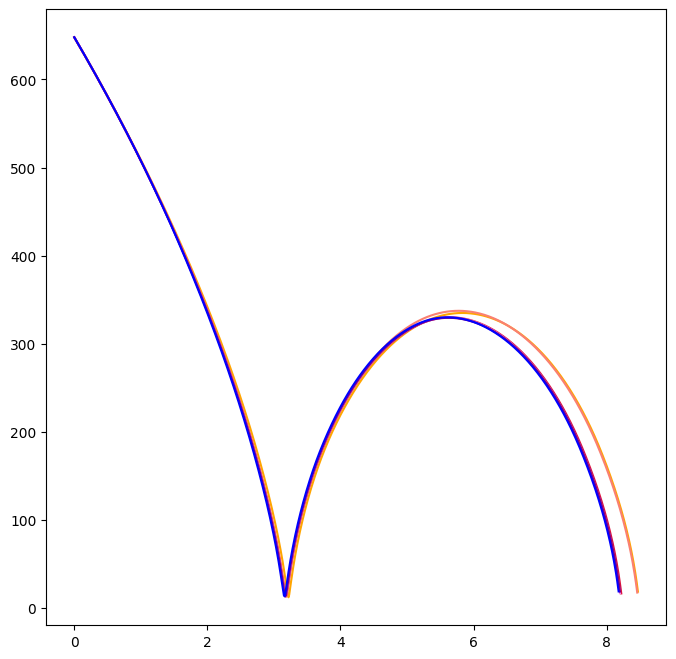

In [55]:
N_list=[2,3,4,5,6,10,20,40]

N_positions=[]
N_velocities=[]
N_masses=[]
N_t_all=[]
N_r_M31=[]
N_b=[]
N_t=[]
N_keep_mass_max=[]
N_times_M31=[]
N_sum_mass=[]

colors=['gold','orange','salmon','crimson','violet','purple','blue','cornflowerblue','steelblue','mediumturquoise','aquamarine']
fig=plt.figure(figsize=(8,8), dpi=100)

j=0

for i in N_list :
    j=j+1
    print(i)
    N=i 
    positions, velocities, masses, t_all, r_M31, b, t, keep_mass_max, times_M31, sum_mass, vr, vt=execution(np.load('/mnt/c/Users/jehan/notebookjupy/Helsinki/testfile.npz'))
    N_positions.append(positions) #list containing positions for each N, poisitions[0]=positions for N=2
    N_velocities.append(velocities)
    N_masses.append(masses)
    N_t_all.append(t_all)
    N_r_M31.append(r_M31)
    N_b.append(b)
    N_t.append(t)
    N_keep_mass_max.append(keep_mass_max)
    N_times_M31.append(times_M31)
    N_sum_mass.append(sum_mass)
    plt.plot(t_all[times_M31],r_M31[times_M31], color=colors[j], label=i)





plt.xlabel('t (Gyr)')
plt.ylabel('$r_{M31}$ (kpc)')
plt.legend()


Text(0.5, 0, 'Number of Galaxies')

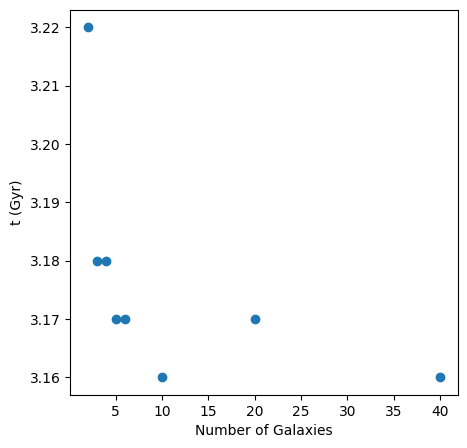

In [ ]:
fig= plt.figure(figsize=(5,5), dpi=100)
plt.scatter(N_list, N_t)
plt.ylabel('t (Gyr)')
plt.xlabel('Number of Galaxies')

Text(0.5, 0, 'Number of Galaxies')

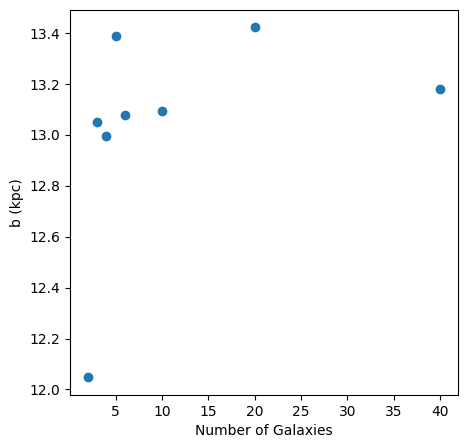

In [ ]:
fig= plt.figure(figsize=(5,5), dpi=100)
plt.scatter(N_list, N_b)
plt.ylabel('b (kpc)')
plt.xlabel('Number of Galaxies')

Text(0.5, 0, 'Number of Galaxies')

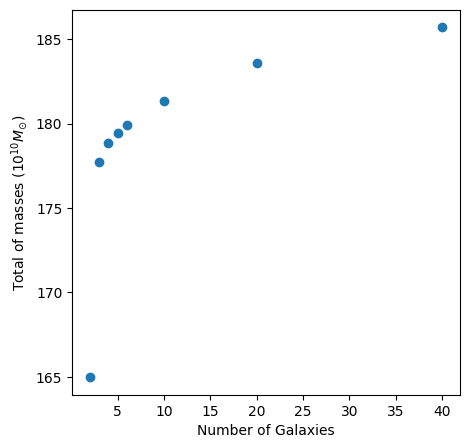

In [ ]:
fig= plt.figure(figsize=(5,5), dpi=100)
plt.scatter(N_list,N_sum_mass)
plt.ylabel('Total of masses ($10^{10} M_{\odot}$)')
plt.xlabel('Number of Galaxies')

Text(0.5, 0, 'b (kpc)')

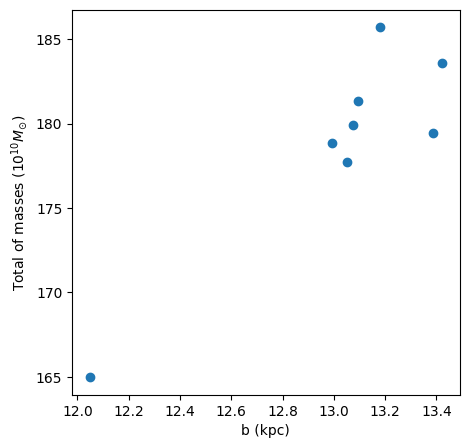

In [ ]:
fig= plt.figure(figsize=(5,5), dpi=100)
plt.scatter(N_b,N_sum_mass)
plt.ylabel('Total of masses ($10^{10} M_{\odot}$)')
plt.xlabel('b (kpc)')

# Main for multiples files

In [ ]:

N_list=[2,3, 4, 5, 6, 10 ,20,40]



colors=['gold','orange','salmon','crimson','violet','purple','blue','cornflowerblue','steelblue','mediumturquoise','aquamarine']

folder = "/mnt/c/Users/jehan/notebookjupy/Helsinki/Sibelius"

fig=plt.figure(figsize=(10,10), dpi=100)


#define arrays where to append for eveyfile

N_positions_list=[]
N_velocities_list=[]
N_masses_list=[]
N_t_all_list=[]
N_r_M31_list=[]
N_b_list=[]
N_t_list=[]
N_keep_mass_max_list=[]
N_times_M31_list=[]
N_sum_mass_list=[]
N_vr_list=[]
N_vt_list=[]



for file in tqdm(os.listdir(folder)) :
    
    if file.endswith(".npz"):
        file_way = os.path.join(folder, file)
        content = np.load(file_way)
        print(file)


        #Action to do with file


        N_positions=[]
        N_velocities=[]
        N_masses=[]
        N_t_all=[]
        N_r_M31=[]
        N_b=[]
        N_t=[]
        N_keep_mass_max=[]
        N_times_M31=[]
        N_sum_mass=[]
        N_vr=[]
        N_vt=[]


        j=0
            

        for i in N_list :
            j=j+1
            print(i)
            N=i 
            positions, velocities, masses, t_all, r_M31, b, t, keep_mass_max, times_M31, sum_mass, vr, vt  = execution(content)

            N_positions.append(positions) #list containing positions for each N, positions[0]=positions for N=2
            N_velocities.append(velocities)
            N_masses.append(masses)
            N_t_all.append(t_all)
            N_r_M31.append(r_M31)
            N_b.append(b)
            N_t.append(t)
            N_keep_mass_max.append(keep_mass_max)
            N_times_M31.append(times_M31)
            N_sum_mass.append(sum_mass)
            N_vr.append(vr)
            N_vt.append(vt)


    
       

        N_positions_list.append(N_positions)
        N_velocities_list.append(N_velocities)
        N_masses_list.append(N_masses)
        N_t_all_list.append(N_t_all)
        N_r_M31_list.append(N_r_M31)
        N_b_list.append(N_b)
        N_t_list.append(N_t)
        N_keep_mass_max_list.append(N_keep_mass_max)
        N_times_M31_list.append(N_times_M31)
        N_sum_mass_list.append(N_sum_mass)
        N_vr_list.append(N_vr)
        N_vt_list.append(N_vt)


        #Closing current file
        content.close()








  0%|                                                                                           | 0/105 [00:00<?, ?it/s]

output_10560.npz
2
Number of galaxies in the simulation : 73560
Number of galaxies kept in the local group :  1117
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.799999999999921 Gyr
b MW - M31: 34.18493957281831
t = 3.52
Total velocity= 144.0326460648291 km/s
Radial velocity= -139.77995000441985 km/s
Transverse velocity= 34.741455196900084 km/s
3
Number of galaxies in the simulation : 73560
Number of galaxies kept in the local group :  1117
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 3.1999999999999758 Gyr
Galaxy 1 has merged with galaxy 0 at 5.469999999999928 Gyr
b MW - M31: 41.16074613179769
t = 3.46
Total velocity= 144.03264985452083 km/s
Radial velocity= -139.77995366295568 km/s
Transverse velocity= 34.741456188492755 km/s
4
Number o

  1%|▊                                                                                | 1/105 [01:25<2:28:05, 85.44s/it]

b MW - M31: 40.442515193908825
t = 3.27
Total velocity= 144.0326457501532 km/s
Radial velocity= -139.77994944345232 km/s
Transverse velocity= 34.741456149318736 km/s
output_11099.npz
2
Number of galaxies in the simulation : 70514
Number of galaxies kept in the local group :  1017
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.559999999999926 Gyr
b MW - M31: 45.47909928174656
t = 3.24
Total velocity= 160.24241548365575 km/s
Radial velocity= -154.17583334372713 km/s
Transverse velocity= 43.67429601955629 km/s
3
Number of galaxies in the simulation : 70514
Number of galaxies kept in the local group :  1017
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.569999999999926 Gyr
b MW - M31: 39.902840285089376
t = 3.3000000000000003
Total velocity= 

  2%|█▌                                                                              | 2/105 [03:16<2:52:07, 100.27s/it]

b MW - M31: 52.660111947219875
t = 3.2800000000000002
Total velocity= 160.2424154326619 km/s
Radial velocity= -154.17583337320215 km/s
Transverse velocity= 43.674295728407586 km/s
output_11768.npz
2
Number of galaxies in the simulation : 78770
Number of galaxies kept in the local group :  987
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 183.6773979278883
t = 2.58
Total velocity= 174.33446463844373 km/s
Radial velocity= -131.81808968750283 km/s
Transverse velocity= 114.08986279205635 km/s
3
Number of galaxies in the simulation : 78770
Number of galaxies kept in the local group :  987
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 9.939999999999833 Gyr
b MW - M31: 180.5517078191705
t = 2.58
Total velocity= 174.3344638524 km/s
Radial velocity= -131.81808922852753 km/s

  3%|██▎                                                                              | 3/105 [04:48<2:44:33, 96.80s/it]

b MW - M31: 178.6874285511704
t = 2.57
Total velocity= 174.33447142854223 km/s
Radial velocity= -131.81809559272452 km/s
Transverse velocity= 114.08986634480972 km/s
output_12917.npz
2
Number of galaxies in the simulation : 82627
Number of galaxies kept in the local group :  843
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.089999999999915 Gyr
b MW - M31: 82.20183703531278
t = 4.25
Total velocity= 127.2712892646195 km/s
Radial velocity= -114.33351082088087 km/s
Transverse velocity= 55.90911709596178 km/s
3
Number of galaxies in the simulation : 82627
Number of galaxies kept in the local group :  843
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.079999999999915 Gyr
b MW - M31: 81.25652140639822
t = 4.25
Total velocity= 127.2712892646195 

  4%|███                                                                              | 4/105 [06:18<2:38:01, 93.88s/it]

b MW - M31: 78.57884984000285
t = 4.2
Total velocity= 127.2712892646195 km/s
Radial velocity= -114.33351082088087 km/s
Transverse velocity= 55.90911709596178 km/s
output_13035.npz
2
Number of galaxies in the simulation : 67121
Number of galaxies kept in the local group :  891
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 9.179999999999849 Gyr
b MW - M31: 136.5806719766284
t = 4.83
Total velocity= 133.46683483816585 km/s
Radial velocity= -117.39798120282666 km/s
Transverse velocity= 63.49102307585698 km/s
3
Number of galaxies in the simulation : 67121
Number of galaxies kept in the local group :  891
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 9.949999999999832 Gyr
b MW - M31: 138.10863971869938
t = 4.8500000000000005
Total velocity= 133.4

  5%|███▊                                                                             | 5/105 [07:49<2:34:44, 92.84s/it]

b MW - M31: 131.15694546170747
t = 4.69
Total velocity= 133.46683569904272 km/s
Radial velocity= -117.3979824254984 km/s
Transverse velocity= 63.4910226247588 km/s
output_13412.npz
2
Number of galaxies in the simulation : 84536
Number of galaxies kept in the local group :  647
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.939999999999854 Gyr
b MW - M31: 69.85365207673344
t = 4.03
Total velocity= 155.46093644885016 km/s
Radial velocity= -150.2619375366315 km/s
Transverse velocity= 39.86794312841938 km/s
3
Number of galaxies in the simulation : 84536
Number of galaxies kept in the local group :  647
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 1 at 3.00999999999998 Gyr
b MW - M31: 213.83412457390511
t = 3.0100000000000002
Total velocity= 155.46

  6%|████▋                                                                            | 6/105 [09:19<2:31:32, 91.84s/it]

b MW - M31: 14.75365268801512
t = 3.59
Total velocity= 155.46093642545816 km/s
Radial velocity= -150.26193754522438 km/s
Transverse velocity= 39.86794300481817 km/s
output_13746.npz
2
Number of galaxies in the simulation : 73155
Number of galaxies kept in the local group :  1004
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.619999999999925 Gyr
b MW - M31: 46.761274279218256
t = 3.18
Total velocity= 176.23831680009727 km/s
Radial velocity= -169.95444586396476 km/s
Transverse velocity= 46.64151197810931 km/s
3
Number of galaxies in the simulation : 73155
Number of galaxies kept in the local group :  1004
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.3899999999999295 Gyr
b MW - M31: 50.25029041912506
t = 3.2600000000000002
Total velocity= 

  7%|█████▍                                                                           | 7/105 [10:50<2:29:55, 91.79s/it]

b MW - M31: 47.211264972170554
t = 3.22
Total velocity= 176.23831684377697 km/s
Radial velocity= -169.95444600987904 km/s
Transverse velocity= 46.641511611467216 km/s
output_14233.npz
2
Number of galaxies in the simulation : 54309
Number of galaxies kept in the local group :  970
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.389999999999951 Gyr
b MW - M31: 44.08583568862785
t = 2.33
Total velocity= 174.51402166597498 km/s
Radial velocity= -165.1237414925159 km/s
Transverse velocity= 56.47383246730439 km/s
3
Number of galaxies in the simulation : 54309
Number of galaxies kept in the local group :  970
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.349999999999952 Gyr
b MW - M31: 41.00734224437279
t = 2.31
Total velocity= 174.5140254473737

  8%|██████▏                                                                          | 8/105 [12:21<2:27:45, 91.40s/it]

b MW - M31: 38.071532710259206
t = 2.3000000000000003
Total velocity= 174.51402544783156 km/s
Radial velocity= -165.12374516905572 km/s
Transverse velocity= 56.47383340407437 km/s
output_14287.npz
2
Number of galaxies in the simulation : 17401
Number of galaxies kept in the local group :  873
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.9199999999999395 Gyr
b MW - M31: 31.64621455709121
t = 2.6
Total velocity= 162.8026937888985 km/s
Radial velocity= -157.6521548324773 km/s
Transverse velocity= 40.626532975365414 km/s
3
Number of galaxies in the simulation : 17401
Number of galaxies kept in the local group :  873
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.019999999999937 Gyr
Galaxy 2 has merged with galaxy 0 at 6.619999999999903 Gyr


  9%|██████▉                                                                          | 9/105 [13:45<2:22:22, 88.99s/it]

b MW - M31: 35.10370820781295
t = 2.54
Total velocity= 162.8026925044815 km/s
Radial velocity= -157.65215304822064 km/s
Transverse velocity= 40.62653475216876 km/s
output_15308.npz
2
Number of galaxies in the simulation : 79025
Number of galaxies kept in the local group :  1093
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 9.069999999999851 Gyr
b MW - M31: 26.743251627482604
t = 2.91
Total velocity= 184.40943473347374 km/s
Radial velocity= -181.2460294027076 km/s
Transverse velocity= 34.01053431618167 km/s
3
Number of galaxies in the simulation : 79025
Number of galaxies kept in the local group :  1093
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 8.379999999999866 Gyr
b MW - M31: 28.003435456171133
t = 2.94
Total velocity= 184.409434737193

 10%|███████▌                                                                        | 10/105 [15:12<2:20:04, 88.47s/it]

b MW - M31: 22.587165357297355
t = 2.89
Total velocity= 184.40943456950217 km/s
Radial velocity= -181.24602909661965 km/s
Transverse velocity= 34.01053505828463 km/s
output_16171.npz
2
Number of galaxies in the simulation : 64471
Number of galaxies kept in the local group :  655
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.699999999999902 Gyr
b MW - M31: 25.911111904820796
t = 4.23
Total velocity= 124.50040911726278 km/s
Radial velocity= -122.07868698929126 km/s
Transverse velocity= 24.436572045531648 km/s
3
Number of galaxies in the simulation : 64471
Number of galaxies kept in the local group :  655
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.159999999999913 Gyr
Galaxy 2 has merged with galaxy 0 at 9.989999999999831 Gyr
b MW - M31:

 10%|████████▍                                                                       | 11/105 [16:42<2:19:20, 88.94s/it]

b MW - M31: 30.399150235412325
t = 4.07
Total velocity= 124.50040998153803 km/s
Radial velocity= -122.07868785023084 km/s
Transverse velocity= 24.43657214784748 km/s
output_166.npz
2
Number of galaxies in the simulation : 80166
Number of galaxies kept in the local group :  985
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 7.339999999999888 Gyr
b MW - M31: 25.719698833024967
t = 2.65
Total velocity= 181.61743630119676 km/s
Radial velocity= -178.25425527686113 km/s
Transverse velocity= 34.7895622897284 km/s
3
Number of galaxies in the simulation : 80166
Number of galaxies kept in the local group :  985
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 7.399999999999887 Gyr
b MW - M31: 25.308712743714885
t = 2.64
Total velocity= 181.6174375142936 

 11%|█████████▏                                                                      | 12/105 [18:15<2:19:59, 90.31s/it]

b MW - M31: 31.1018255610847
t = 2.64
Total velocity= 181.6174375142936 km/s
Radial velocity= -178.25425632587323 km/s
Transverse velocity= 34.789563247736126 km/s
output_17285.npz
2
Number of galaxies in the simulation : 83615
Number of galaxies kept in the local group :  691
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.1899999999999125 Gyr
b MW - M31: 21.874209706179354
t = 3.8000000000000003
Total velocity= 118.71983629016808 km/s
Radial velocity= -115.78652249904556 km/s
Transverse velocity= 26.227480556514074 km/s
3
Number of galaxies in the simulation : 83615
Number of galaxies kept in the local group :  691
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 2.339999999999994 Gyr
Galaxy 1 has merged with galaxy 0 at 10.159999999999828 G

 12%|█████████▉                                                                      | 13/105 [19:36<2:13:50, 87.28s/it]

b MW - M31: 10.234151134418216
t = 3.5700000000000003
Total velocity= 118.71983736753637 km/s
Radial velocity= -115.78652360562086 km/s
Transverse velocity= 26.22748054806807 km/s
output_17309.npz
2
Number of galaxies in the simulation : 81663
Number of galaxies kept in the local group :  995
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.23999999999989 Gyr
b MW - M31: 17.385380197368683
t = 4.09
Total velocity= 108.49095048307878 km/s
Radial velocity= -106.24659925017319 km/s
Transverse velocity= 21.95327958403821 km/s
3
Number of galaxies in the simulation : 81663
Number of galaxies kept in the local group :  995
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 1.9500000000000015 Gyr
Galaxy 1 has merged with galaxy 0 at 7.339999999999888 Gy

 13%|██████████▋                                                                     | 14/105 [21:00<2:11:11, 86.50s/it]

b MW - M31: 16.403150502945806
t = 3.62
Total velocity= 108.49094815574226 km/s
Radial velocity= -106.2465969136143 km/s
Transverse velocity= 21.95327939074071 km/s
output_17620.npz
2
Number of galaxies in the simulation : 73092
Number of galaxies kept in the local group :  890
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.869999999999919 Gyr
b MW - M31: 63.911513041129574
t = 4.13
Total velocity= 121.04891019321622 km/s
Radial velocity= -110.81280991697798 km/s
Transverse velocity= 48.71714089793274 km/s
3
Number of galaxies in the simulation : 73092
Number of galaxies kept in the local group :  890
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.789999999999921 Gyr
b MW - M31: 68.26442744744189
t = 4.14
Total velocity= 121.0489033641202

 14%|███████████▍                                                                    | 15/105 [22:33<2:12:28, 88.31s/it]

b MW - M31: 68.26469834247038
t = 4.0600000000000005
Total velocity= 121.0489067786682 km/s
Radial velocity= -110.81280702579897 km/s
Transverse velocity= 48.717138990028346 km/s
output_18047.npz
2
Number of galaxies in the simulation : 60683
Number of galaxies kept in the local group :  639
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.37999999999993 Gyr
b MW - M31: 31.95680329833394
t = 3.47
Total velocity= 119.38283591593398 km/s
Radial velocity= -113.90849614510368 km/s
Transverse velocity= 35.736760027900054 km/s
3
Number of galaxies in the simulation : 60683
Number of galaxies kept in the local group :  639
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.36999999999993 Gyr
b MW - M31: 32.74539779657589
t = 3.47
Total velocity= 119.3

 15%|████████████▏                                                                   | 16/105 [24:01<2:11:04, 88.36s/it]

b MW - M31: 28.52687722762219
t = 3.44
Total velocity= 119.38283477712103 km/s
Radial velocity= -113.90849521967336 km/s
Transverse velocity= 35.73675917330825 km/s
output_18608.npz
2
Number of galaxies in the simulation : 76834
Number of galaxies kept in the local group :  816
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.959999999999896 Gyr
b MW - M31: 85.19840315242432
t = 4.5600000000000005
Total velocity= 135.23263087785693 km/s
Radial velocity= -126.65423409180184 km/s
Transverse velocity= 47.39798983887149 km/s
3
Number of galaxies in the simulation : 76834
Number of galaxies kept in the local group :  816
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 1.1300000000000008 Gyr
Galaxy 1 has merged with galaxy 0 at 6.829999999999899 Gyr

 16%|████████████▉                                                                   | 17/105 [25:33<2:11:00, 89.32s/it]

b MW - M31: 87.28923833744498
t = 4.46
Total velocity= 135.23263087785693 km/s
Radial velocity= -126.65423409180184 km/s
Transverse velocity= 47.39798983887149 km/s
output_19439.npz
2
Number of galaxies in the simulation : 64045
Number of galaxies kept in the local group :  1174
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 11.442701615893537
t = 3.59
Total velocity= 120.00183659519871 km/s
Radial velocity= -118.86026412951335 km/s
Transverse velocity= 16.512976633032963 km/s
3
Number of galaxies in the simulation : 64045
Number of galaxies kept in the local group :  1174
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 1 at 2.0500000000000003 Gyr
b MW - M31: 11.498928677521274
t = 3.64
Total velocity= 120.00183623168853 km/s
Radial velocity= -118.86026381157927 km/s
Trans

 17%|█████████████▋                                                                  | 18/105 [27:02<2:09:31, 89.33s/it]

b MW - M31: 12.794044733212264
t = 3.58
Total velocity= 120.00184301462671 km/s
Radial velocity= -118.86027059551078 km/s
Transverse velocity= 16.5129767416135 km/s
output_19565.npz
2
Number of galaxies in the simulation : 30563
Number of galaxies kept in the local group :  1051
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.089999999999936 Gyr
b MW - M31: 70.08617720170594
t = 3.49
Total velocity= 120.23309338458596 km/s
Radial velocity= -104.19187199614898 km/s
Transverse velocity= 60.00042128822658 km/s
3
Number of galaxies in the simulation : 30563
Number of galaxies kept in the local group :  1051
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.049999999999937 Gyr
Galaxy 2 has merged with galaxy 0 at 6.409999999999908 Gyr
b MW - M31: 

 18%|██████████████▍                                                                 | 19/105 [28:31<2:07:44, 89.13s/it]

b MW - M31: 52.206298303336006
t = 3.34
Total velocity= 120.23309709957448 km/s
Radial velocity= -104.19187560337654 km/s
Transverse velocity= 60.00042246856443 km/s
output_20111.npz
2
Number of galaxies in the simulation : 59527
Number of galaxies kept in the local group :  1014
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 13.955396927376835
t = 3.44
Total velocity= 165.8453023811686 km/s
Radial velocity= -164.49399812539804 km/s
Transverse velocity= 21.12791761207902 km/s
3
Number of galaxies in the simulation : 59527
Number of galaxies kept in the local group :  1014
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 13.399756449520547
t = 3.43
Total velocity= 165.84529878013248 km/s
Radial velocity= -164.49399469808728 km/s
Transverse velocity= 21.1279160292029 km/s
4
Number of galaxies in

 19%|███████████████▏                                                                | 20/105 [30:09<2:10:08, 91.87s/it]

b MW - M31: 13.976198611726097
t = 3.4
Total velocity= 165.8452949616991 km/s
Radial velocity= -164.4939909455924 km/s
Transverse velocity= 21.12791527161016 km/s
output_20578.npz
2
Number of galaxies in the simulation : 19743
Number of galaxies kept in the local group :  675
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 9.229999999999848 Gyr
b MW - M31: 98.9498734299789
t = 4.68
Total velocity= 142.80823304891712 km/s
Radial velocity= -134.56289593964954 km/s
Transverse velocity= 47.82278183971391 km/s
3
Number of galaxies in the simulation : 19743
Number of galaxies kept in the local group :  675
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 3.46999999999997 Gyr
Galaxy 1 has merged with galaxy 0 at 8.66999999999986 Gyr
b MW - M31: 97.7186

 20%|████████████████                                                                | 21/105 [31:40<2:08:04, 91.48s/it]

b MW - M31: 84.68084452472267
t = 4.74
Total velocity= 142.8082329376528 km/s
Radial velocity= -134.5628955655528 km/s
Transverse velocity= 47.822782560083596 km/s
output_21085.npz
2
Number of galaxies in the simulation : 52546
Number of galaxies kept in the local group :  1006
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.599999999999925 Gyr
b MW - M31: 52.299786059831504
t = 3.3000000000000003
Total velocity= 162.1234627186605 km/s
Radial velocity= -155.62139490418542 km/s
Transverse velocity= 45.453257440633166 km/s
3
Number of galaxies in the simulation : 52546
Number of galaxies kept in the local group :  1006
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.599999999999925 Gyr
b MW - M31: 49.79902971377269
t = 3.2800000000000002
Tota

 21%|████████████████▊                                                               | 22/105 [33:08<2:05:05, 90.43s/it]

b MW - M31: 44.5325122595195
t = 3.24
Total velocity= 162.12346296109155 km/s
Radial velocity= -155.62139557456408 km/s
Transverse velocity= 45.45325601011956 km/s
output_21258.npz
2
Number of galaxies in the simulation : 61323
Number of galaxies kept in the local group :  1419
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.649999999999945 Gyr
b MW - M31: 39.185915717786315
t = 2.41
Total velocity= 176.83641212397677 km/s
Radial velocity= -167.37008841401303 km/s
Transverse velocity= 57.082135184017254 km/s
3
Number of galaxies in the simulation : 61323
Number of galaxies kept in the local group :  1419
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.529999999999948 Gyr
Galaxy 2 has merged with galaxy 0 at 10.53999999999982 Gyr
b MW - M31:

 22%|█████████████████▌                                                              | 23/105 [34:31<2:00:40, 88.30s/it]

b MW - M31: 48.11409302397839
t = 2.38
Total velocity= 176.83641700166547 km/s
Radial velocity= -167.37009396042615 km/s
Transverse velocity= 57.0821340321562 km/s
output_21826.npz
2
Number of galaxies in the simulation : 58358
Number of galaxies kept in the local group :  963
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.179999999999934 Gyr
b MW - M31: 31.930348298205708
t = 2.77
Total velocity= 163.10910965373142 km/s
Radial velocity= -156.8536530587748 km/s
Transverse velocity= 44.738274152569765 km/s
3
Number of galaxies in the simulation : 58358
Number of galaxies kept in the local group :  963
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.1099999999999355 Gyr
b MW - M31: 32.55341313013199
t = 2.77
Total velocity= 163.1091071008807

 23%|██████████████████▎                                                             | 24/105 [36:00<1:59:37, 88.61s/it]

b MW - M31: 32.33785827746917
t = 2.75
Total velocity= 163.10910965569508 km/s
Radial velocity= -156.85365305630884 km/s
Transverse velocity= 44.738274168374645 km/s
output_22518.npz
2
Number of galaxies in the simulation : 92284
Number of galaxies kept in the local group :  1021
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 10.145599240240923
t = 2.64
Total velocity= 169.4206760215359 km/s
Radial velocity= -168.29146731867328 km/s
Transverse velocity= 19.52812052713098 km/s
3
Number of galaxies in the simulation : 92284
Number of galaxies kept in the local group :  1021
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 2.6499999999999875 Gyr
b MW - M31: 10.0
t = 2.64
Total velocity= 169.4206686147081 km/s
Radial velocity= -168.29145980724385 km/s
Transverse velocity= 

 24%|███████████████████                                                             | 25/105 [37:31<1:59:10, 89.38s/it]

b MW - M31: 11.13870382199122
t = 2.63
Total velocity= 169.4206686306999 km/s
Radial velocity= -168.29145980161766 km/s
Transverse velocity= 19.5281211875063 km/s
output_22715.npz
2
Number of galaxies in the simulation : 71693
Number of galaxies kept in the local group :  786
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.599999999999861 Gyr
b MW - M31: 15.439274354906196
t = 2.31
Total velocity= 159.81210592766064 km/s
Radial velocity= -157.24721392143204 km/s
Transverse velocity= 28.51706357571227 km/s
3
Number of galaxies in the simulation : 71693
Number of galaxies kept in the local group :  786
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.549999999999862 Gyr
b MW - M31: 14.809846108068019
t = 2.31
Total velocity= 159.81210354628368

 25%|███████████████████▊                                                            | 26/105 [39:04<1:59:01, 90.39s/it]

b MW - M31: 12.985668617103846
t = 2.31
Total velocity= 159.8121047762685 km/s
Radial velocity= -157.2472125322266 km/s
Transverse velocity= 28.517064783490323 km/s
output_22875.npz
2
Number of galaxies in the simulation : 91899
Number of galaxies kept in the local group :  777
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.519999999999927 Gyr
b MW - M31: 22.47111581160769
t = 3.46
Total velocity= 105.36943453247703 km/s
Radial velocity= -100.85736985141058 km/s
Transverse velocity= 30.50424036670538 km/s
3
Number of galaxies in the simulation : 91899
Number of galaxies kept in the local group :  777
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.83999999999992 Gyr
b MW - M31: 17.408209599958756
t = 3.4
Total velocity= 105.36943608539569 

 26%|████████████████████▌                                                           | 27/105 [40:40<1:59:36, 92.01s/it]

b MW - M31: 18.634433477177843
t = 3.36
Total velocity= 105.36943511459202 km/s
Radial velocity= -100.85737114617216 km/s
Transverse velocity= 30.504238096557977 km/s
output_23193.npz
2
Number of galaxies in the simulation : 24623
Number of galaxies kept in the local group :  1049
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.34999999999993 Gyr
b MW - M31: 71.54190385855156
t = 3.54
Total velocity= 143.82397945081615 km/s
Radial velocity= -129.97308302076738 km/s
Transverse velocity= 61.58193529879925 km/s
3
Number of galaxies in the simulation : 24623
Number of galaxies kept in the local group :  1049
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 0.24000000000000007 Gyr
Galaxy 1 has merged with galaxy 0 at 5.329999999999931 Gyr
b MW - M3

 27%|█████████████████████▎                                                          | 28/105 [41:53<1:50:37, 86.20s/it]

b MW - M31: 57.565465660265666
t = 3.29
Total velocity= 143.82397641107772 km/s
Radial velocity= -129.97307953659515 km/s
Transverse velocity= 61.58193555311617 km/s
output_23653.npz
2
Number of galaxies in the simulation : 63860
Number of galaxies kept in the local group :  1252
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.749999999999943 Gyr
b MW - M31: 39.54966189999902
t = 2.74
Total velocity= 150.54365185413596 km/s
Radial velocity= -142.94844904730866 km/s
Transverse velocity= 47.213684759276 km/s
3
Number of galaxies in the simulation : 63860
Number of galaxies kept in the local group :  1252
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 2.339999999999994 Gyr
Galaxy 2 has merged with galaxy 0 at 8.859999999999856 Gyr
b MW - M31: 1

 28%|██████████████████████                                                          | 29/105 [43:24<1:51:19, 87.89s/it]

b MW - M31: 10.681550821179954
t = 2.34
Total velocity= 150.5436487169652 km/s
Radial velocity= -142.94844548404865 km/s
Transverse velocity= 47.21368554467011 km/s
output_26075.npz
2
Number of galaxies in the simulation : 84502
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 17.786013204490008
t = 3.52
Total velocity= 137.7688159440703 km/s
Radial velocity= -135.50088221284682 km/s
Transverse velocity= 24.89493053156266 km/s
3
Number of galaxies in the simulation : 84502
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 16.904389324037357
t = 3.48
Total velocity= 137.7688159440703 km/s
Radial velocity= -135.50088221284682 km/s
Transverse velocity= 24.89493053156266 km/s
4
Number of galaxies in th

 29%|██████████████████████▊                                                         | 30/105 [44:56<1:51:04, 88.86s/it]

b MW - M31: 14.757127256536537
t = 3.44
Total velocity= 137.7688159440703 km/s
Radial velocity= -135.50088221284682 km/s
Transverse velocity= 24.89493053156266 km/s
output_266.npz
2
Number of galaxies in the simulation : 96659
Number of galaxies kept in the local group :  717
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.209999999999933 Gyr
b MW - M31: 68.83319148299037
t = 3.27
Total velocity= 153.9555497486375 km/s
Radial velocity= -142.24975588138162 km/s
Transverse velocity= 58.88393881265532 km/s
3
Number of galaxies in the simulation : 96659
Number of galaxies kept in the local group :  717
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 3.5299999999999687 Gyr
Galaxy 1 has merged with galaxy 0 at 5.149999999999935 Gyr
b MW - M31: 70.4

 30%|███████████████████████▌                                                        | 31/105 [46:21<1:48:12, 87.73s/it]

b MW - M31: 68.80040010950025
t = 3.25
Total velocity= 153.95554595625984 km/s
Radial velocity= -142.2497522216847 km/s
Transverse velocity= 58.88393773822658 km/s
output_26657.npz
2
Number of galaxies in the simulation : 24707
Number of galaxies kept in the local group :  850
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 9.909999999999833 Gyr
b MW - M31: 11.929027422676688
t = 2.9
Total velocity= 127.45817757704737 km/s
Radial velocity= -126.08953307946086 km/s
Transverse velocity= 18.628383694397215 km/s
3
Number of galaxies in the simulation : 24707
Number of galaxies kept in the local group :  850
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 2.849999999999983 Gyr
Galaxy 2 has merged with galaxy 0 at 5.949999999999918 Gyr
b MW - M31: 10

 30%|████████████████████████▍                                                       | 32/105 [47:41<1:43:52, 85.38s/it]

b MW - M31: 10.590185762417715
t = 2.84
Total velocity= 127.4581774739972 km/s
Radial velocity= -126.08953311536037 km/s
Transverse velocity= 18.62838274632039 km/s
output_28091.npz
2
Number of galaxies in the simulation : 20867
Number of galaxies kept in the local group :  669
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.9999999999999165 Gyr
b MW - M31: 26.433775823325558
t = 3.98
Total velocity= 111.28085177402347 km/s
Radial velocity= -107.93010636741081 km/s
Transverse velocity= 27.102031493442915 km/s
3
Number of galaxies in the simulation : 20867
Number of galaxies kept in the local group :  669
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.9999999999999165 Gyr
b MW - M31: 26.531168046554246
t = 3.98
Total velocity= 111.280851074

 31%|█████████████████████████▏                                                      | 33/105 [49:05<1:42:01, 85.02s/it]

b MW - M31: 26.163901827330143
t = 3.93
Total velocity= 111.28085113644289 km/s
Radial velocity= -107.93010596888489 km/s
Transverse velocity= 27.10203046261373 km/s
output_29526.npz
2
Number of galaxies in the simulation : 83334
Number of galaxies kept in the local group :  946
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 10.339999999999824 Gyr
b MW - M31: 12.066203701885858
t = 3.36
Total velocity= 101.93409709613357 km/s
Radial velocity= -100.11287404908792 km/s
Transverse velocity= 19.182611929438732 km/s
3
Number of galaxies in the simulation : 83334
Number of galaxies kept in the local group :  946
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 10.09142687015538
t = 3.3000000000000003
Total velocity= 101.93409826123806 km/s
Radial velocity= -100.1128752367668

 32%|█████████████████████████▉                                                      | 34/105 [50:34<1:42:16, 86.43s/it]

b MW - M31: 13.800171385055947
t = 3.19
Total velocity= 101.93409709540933 km/s
Radial velocity= -100.11287404285265 km/s
Transverse velocity= 19.18261195813166 km/s
output_29657.npz
2
Number of galaxies in the simulation : 80703
Number of galaxies kept in the local group :  953
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 100.04341653629801
t = 1.28
Total velocity= 245.4576335577621 km/s
Radial velocity= -207.05658192772833 km/s
Transverse velocity= 131.82193198471396 km/s
3
Number of galaxies in the simulation : 80703
Number of galaxies kept in the local group :  953
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 99.82359150960546
t = 1.28
Total velocity= 245.45763342030114 km/s
Radial velocity= -207.0565783200145 km/s
Transverse velocity= 131.82193739549817 km/s
4
Number of galaxies in 

 33%|██████████████████████████▋                                                     | 35/105 [51:57<1:39:35, 85.37s/it]

b MW - M31: 101.04718347080727
t = 1.28
Total velocity= 245.4576324204657 km/s
Radial velocity= -207.05658256878857 km/s
Transverse velocity= 131.82192886009102 km/s
output_30284.npz
2
Number of galaxies in the simulation : 61426
Number of galaxies kept in the local group :  1137
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.179999999999934 Gyr
b MW - M31: 40.721775756271796
t = 3.15
Total velocity= 144.1234730505502 km/s
Radial velocity= -136.70285139732377 km/s
Transverse velocity= 45.64981822520085 km/s
3
Number of galaxies in the simulation : 61426
Number of galaxies kept in the local group :  1137
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.139999999999892 Gyr
b MW - M31: 29.304725152995818
t = 3.02
Total velocity= 144.1234760193

 34%|███████████████████████████▍                                                    | 36/105 [53:21<1:37:34, 84.85s/it]

b MW - M31: 21.38464597574393
t = 2.9
Total velocity= 144.12347906780047 km/s
Radial velocity= -136.70285861775045 km/s
Transverse velocity= 45.64981560030725 km/s
output_30462.npz
2
Number of galaxies in the simulation : 60866
Number of galaxies kept in the local group :  1114
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.179999999999955 Gyr
b MW - M31: 28.274387429255487
t = 1.96
Total velocity= 173.38930304635042 km/s
Radial velocity= -164.0961506519426 km/s
Transverse velocity= 56.0027120067779 km/s
3
Number of galaxies in the simulation : 60866
Number of galaxies kept in the local group :  1114
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.159999999999956 Gyr
b MW - M31: 29.150920193001692
t = 1.96
Total velocity= 173.3893037982255

 35%|████████████████████████████▏                                                   | 37/105 [54:53<1:38:34, 86.97s/it]

b MW - M31: 27.793033676857416
t = 1.94
Total velocity= 173.38929989911057 km/s
Radial velocity= -164.09614865269896 km/s
Transverse velocity= 56.00270812072423 km/s
output_30562.npz
2
Number of galaxies in the simulation : 98361
Number of galaxies kept in the local group :  1109
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 14.169949855177485
t = 3.75
Total velocity= 159.8605093271601 km/s
Radial velocity= -159.0655564153065 km/s
Transverse velocity= 15.922663239168868 km/s
3
Number of galaxies in the simulation : 98361
Number of galaxies kept in the local group :  1109
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 10.819999999999814 Gyr
b MW - M31: 17.376236371770688
t = 3.77
Total velocity= 159.86050731982456 km/s
Radial velocity= -159.0655538866496 km/s
Transve

 36%|████████████████████████████▉                                                   | 38/105 [56:26<1:39:06, 88.75s/it]

b MW - M31: 18.083028750199038
t = 3.71
Total velocity= 159.86050555272482 km/s
Radial velocity= -159.06555246459877 km/s
Transverse velocity= 15.922664811668179 km/s
output_30594.npz
2
Number of galaxies in the simulation : 53241
Number of galaxies kept in the local group :  885
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.769999999999943 Gyr
b MW - M31: 48.928200358644
t = 2.92
Total velocity= 145.34743023770235 km/s
Radial velocity= -135.57344795954154 km/s
Transverse velocity= 52.39957714586288 km/s
3
Number of galaxies in the simulation : 53241
Number of galaxies kept in the local group :  885
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.749999999999943 Gyr
b MW - M31: 49.09247312543255
t = 2.89
Total velocity= 145.34743023770235

 37%|█████████████████████████████▋                                                  | 39/105 [57:50<1:36:04, 87.35s/it]

b MW - M31: 44.745748674550725
t = 2.83
Total velocity= 145.34743231636452 km/s
Radial velocity= -135.5734496431024 km/s
Transverse velocity= 52.399578555837074 km/s
output_30841.npz
2
Number of galaxies in the simulation : 56735
Number of galaxies kept in the local group :  738
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.139999999999892 Gyr
b MW - M31: 107.11394098983715
t = 4.73
Total velocity= 122.61443289961906 km/s
Radial velocity= -110.43572166237348 km/s
Transverse velocity= 53.27523379775969 km/s
3
Number of galaxies in the simulation : 56735
Number of galaxies kept in the local group :  738
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.129999999999892 Gyr
b MW - M31: 106.75108678245472
t = 4.72
Total velocity= 122.61442908035

 38%|██████████████████████████████▍                                                 | 40/105 [59:22<1:36:04, 88.69s/it]

b MW - M31: 100.45510561266154
t = 4.68
Total velocity= 122.61443291533992 km/s
Radial velocity= -110.43572157646628 km/s
Transverse velocity= 53.27523401202112 km/s
output_30969.npz
2
Number of galaxies in the simulation : 80945
Number of galaxies kept in the local group :  837
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 3.889999999999961 Gyr
b MW - M31: 10.0
t = 3.88
Total velocity= 148.2614898180407 km/s
Radial velocity= -147.88852546217888 km/s
Transverse velocity= 10.509681236243853 km/s
3
Number of galaxies in the simulation : 80945
Number of galaxies kept in the local group :  837
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 2.6999999999999864 Gyr
Galaxy 1 has merged with galaxy 0 at 3.849999999999962 Gyr
b MW - M31: 10.0
t = 3.84

 39%|██████████████████████████████▍                                               | 41/105 [1:00:46<1:33:09, 87.34s/it]

b MW - M31: 10.0
t = 3.7600000000000002
Total velocity= 148.26148631820766 km/s
Radial velocity= -147.8885220332986 km/s
Transverse velocity= 10.509680113620346 km/s
output_31308.npz
2
Number of galaxies in the simulation : 74931
Number of galaxies kept in the local group :  724
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.019999999999895 Gyr
b MW - M31: 47.90029277780401
t = 4.84
Total velocity= 130.81729188658596 km/s
Radial velocity= -127.07635405689378 km/s
Transverse velocity= 31.060651895077868 km/s
3
Number of galaxies in the simulation : 74931
Number of galaxies kept in the local group :  724
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.049999999999894 Gyr
b MW - M31: 48.57224208364324
t = 4.83
Total velocity= 130.817290116542

 40%|███████████████████████████████▏                                              | 42/105 [1:02:17<1:32:59, 88.57s/it]

b MW - M31: 46.488767570197105
t = 4.76
Total velocity= 130.81728999255031 km/s
Radial velocity= -127.07635229700828 km/s
Transverse velocity= 31.060651118121157 km/s
output_31471.npz
2
Number of galaxies in the simulation : 22154
Number of galaxies kept in the local group :  1101
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 11.88919148013007
t = 2.56
Total velocity= 188.35578731512152 km/s
Radial velocity= -187.44991140826454 km/s
Transverse velocity= 18.450835431846144 km/s
3
Number of galaxies in the simulation : 22154
Number of galaxies kept in the local group :  1101
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 2.5499999999999896 Gyr
b MW - M31: 10.0
t = 2.54
Total velocity= 188.3557943340603 km/s
Radial velocity= -187.4499187374682 km/s
Transverse velocity=

 41%|███████████████████████████████▉                                              | 43/105 [1:03:38<1:28:57, 86.09s/it]

b MW - M31: 10.0
t = 2.47
Total velocity= 188.355793495844 km/s
Radial velocity= -187.4499179865093 km/s
Transverse velocity= 18.45083169670054 km/s
output_32324.npz
2
Number of galaxies in the simulation : 81818
Number of galaxies kept in the local group :  1006
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 9.179999999999849 Gyr
b MW - M31: 25.107647022739844
t = 4.25
Total velocity= 144.0757963201606 km/s
Radial velocity= -142.48873435376314 km/s
Transverse velocity= 21.325938843369197 km/s
3
Number of galaxies in the simulation : 81818
Number of galaxies kept in the local group :  1006
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 10.209999999999827 Gyr
b MW - M31: 22.060869419205684
t = 4.18
Total velocity= 144.0757963201606 km/s
Radial

 42%|████████████████████████████████▋                                             | 44/105 [1:05:09<1:29:09, 87.70s/it]

b MW - M31: 26.66491371594586
t = 3.88
Total velocity= 144.07580380327482 km/s
Radial velocity= -142.48874156463216 km/s
Transverse velocity= 21.325941219257086 km/s
output_32604.npz
2
Number of galaxies in the simulation : 58018
Number of galaxies kept in the local group :  840
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.449999999999928 Gyr
b MW - M31: 59.53440785878734
t = 3.47
Total velocity= 144.69696931877863 km/s
Radial velocity= -135.03652869590422 km/s
Transverse velocity= 51.9841211121223 km/s
3
Number of galaxies in the simulation : 58018
Number of galaxies kept in the local group :  840
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.399999999999929 Gyr
b MW - M31: 56.65528167656294
t = 3.45
Total velocity= 144.69696931877863

 43%|█████████████████████████████████▍                                            | 45/105 [1:06:37<1:27:41, 87.69s/it]

b MW - M31: 53.706420336794665
t = 3.39
Total velocity= 144.69696931877863 km/s
Radial velocity= -135.03652869590422 km/s
Transverse velocity= 51.9841211121223 km/s
output_330.npz
2
Number of galaxies in the simulation : 64075
Number of galaxies kept in the local group :  791
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 10.341508110681465
t = 2.83
Total velocity= 142.25639094730334 km/s
Radial velocity= -141.2651036808314 km/s
Transverse velocity= 16.764583126220714 km/s
3
Number of galaxies in the simulation : 64075
Number of galaxies kept in the local group :  791
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.069999999999936 Gyr
Galaxy 2 has merged with galaxy 0 at 5.269999999999932 Gyr
b MW - M31: 26.120131733690336
t = 2.95
Total velocity= 142.25639475503806

 44%|██████████████████████████████████▏                                           | 46/105 [1:08:02<1:25:35, 87.04s/it]

b MW - M31: 30.81969899117907
t = 2.96
Total velocity= 142.25639473670853 km/s
Radial velocity= -141.26510742082988 km/s
Transverse velocity= 16.764583766608347 km/s
output_33307.npz
2
Number of galaxies in the simulation : 77209
Number of galaxies kept in the local group :  1359
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.359999999999909 Gyr
b MW - M31: 32.696348114213016
t = 2.31
Total velocity= 191.63396811983165 km/s
Radial velocity= -185.19405592354164 km/s
Transverse velocity= 49.26194665196233 km/s
3
Number of galaxies in the simulation : 77209
Number of galaxies kept in the local group :  1359
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 4.709999999999944 Gyr
Galaxy 1 has merged with galaxy 0 at 6.709999999999901 Gyr
b MW - M31

 45%|██████████████████████████████████▉                                           | 47/105 [1:09:26<1:23:08, 86.02s/it]

b MW - M31: 29.621911164486793
t = 2.15
Total velocity= 191.63396832759236 km/s
Radial velocity= -185.19405592578633 km/s
Transverse velocity= 49.26194745173394 km/s
output_3344.npz
2
Number of galaxies in the simulation : 66807
Number of galaxies kept in the local group :  837
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.569999999999926 Gyr
b MW - M31: 42.83490099795281
t = 3.17
Total velocity= 166.40077864330416 km/s
Radial velocity= -159.3891760573556 km/s
Transverse velocity= 47.79445249038024 km/s
3
Number of galaxies in the simulation : 66807
Number of galaxies kept in the local group :  837
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.509999999999927 Gyr
b MW - M31: 44.99681854308587
t = 3.18
Total velocity= 166.40077864330416 

 46%|███████████████████████████████████▋                                          | 48/105 [1:10:54<1:22:16, 86.61s/it]

b MW - M31: 42.62511016712561
t = 3.16
Total velocity= 166.40077864330416 km/s
Radial velocity= -159.3891760573556 km/s
Transverse velocity= 47.79445249038024 km/s
output_33512.npz
2
Number of galaxies in the simulation : 77520
Number of galaxies kept in the local group :  1166
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.889999999999919 Gyr
b MW - M31: 52.116710653139954
t = 3.69
Total velocity= 151.3779564119007 km/s
Radial velocity= -145.2435338670694 km/s
Transverse velocity= 42.656787938718196 km/s
3
Number of galaxies in the simulation : 77520
Number of galaxies kept in the local group :  1166
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.639999999999924 Gyr
b MW - M31: 52.88214380864645
t = 3.59
Total velocity= 151.3779560304106

 47%|████████████████████████████████████▍                                         | 49/105 [1:12:21<1:21:00, 86.79s/it]

b MW - M31: 72.38511614721467
t = 3.65
Total velocity= 151.37796007355576 km/s
Radial velocity= -145.24353690474388 km/s
Transverse velocity= 42.65679058990892 km/s
output_33656.npz
2
Number of galaxies in the simulation : 63355
Number of galaxies kept in the local group :  1046
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 232.23767473201005
t = 6.03
Total velocity= 120.047201618681 km/s
Radial velocity= -101.39422894210901 km/s
Transverse velocity= 64.26928468336511 km/s
3
Number of galaxies in the simulation : 63355
Number of galaxies kept in the local group :  1046
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 313.8792886634839
t = 5.34
Total velocity= 120.0471978080525 km/s
Radial velocity= -101.39422567697792 km/s
Transverse velocity= 64.26928271679836 km/s
4
Number of galaxies in th

 48%|█████████████████████████████████████▏                                        | 50/105 [1:13:46<1:18:56, 86.11s/it]

b MW - M31: 280.7591532203471
t = 7.05
Total velocity= 120.04720551643304 km/s
Radial velocity= -101.3942315250594 km/s
Transverse velocity= 64.2692878889082 km/s
output_349.npz
2
Number of galaxies in the simulation : 57700
Number of galaxies kept in the local group :  913
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.199999999999934 Gyr
b MW - M31: 40.348655268270655
t = 3.17
Total velocity= 137.93598421921718 km/s
Radial velocity= -130.54127462696698 km/s
Transverse velocity= 44.556832936048295 km/s
3
Number of galaxies in the simulation : 57700
Number of galaxies kept in the local group :  913
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.6899999999998805 Gyr
Galaxy 2 has merged with galaxy 0 at 10.749999999999815 Gyr
b MW - M31: 15

 49%|█████████████████████████████████████▉                                        | 51/105 [1:15:12<1:17:36, 86.23s/it]

b MW - M31: 19.952496353432664
t = 2.94
Total velocity= 137.93598421921718 km/s
Radial velocity= -130.54127462696698 km/s
Transverse velocity= 44.556832936048295 km/s
output_35068.npz
2
Number of galaxies in the simulation : 74812
Number of galaxies kept in the local group :  1364
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.619999999999946 Gyr
b MW - M31: 32.19554675783706
t = 2.2
Total velocity= 185.56389121254585 km/s
Radial velocity= -177.73027735563167 km/s
Transverse velocity= 53.34703584110171 km/s
3
Number of galaxies in the simulation : 74812
Number of galaxies kept in the local group :  1364
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 2.9199999999999817 Gyr
Galaxy 1 has merged with galaxy 0 at 4.89999999999994 Gyr
b MW - M31:

 50%|██████████████████████████████████████▋                                       | 52/105 [1:16:34<1:15:00, 84.91s/it]

b MW - M31: 27.283785399466375
t = 2.17
Total velocity= 185.5638930374057 km/s
Radial velocity= -177.7302792791629 km/s
Transverse velocity= 53.34703578033658 km/s
output_35475.npz
2
Number of galaxies in the simulation : 70627
Number of galaxies kept in the local group :  1158
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.37999999999993 Gyr
b MW - M31: 66.70813380300886
t = 3.22
Total velocity= 178.81963986308276 km/s
Radial velocity= -168.1894844945617 km/s
Transverse velocity= 60.73517025757155 km/s
3
Number of galaxies in the simulation : 70627
Number of galaxies kept in the local group :  1158
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 1.0400000000000007 Gyr
Galaxy 1 has merged with galaxy 0 at 5.37999999999993 Gyr
b MW - M31: 71.

 50%|███████████████████████████████████████▎                                      | 53/105 [1:18:04<1:14:48, 86.31s/it]

b MW - M31: 67.34120451657766
t = 3.23
Total velocity= 178.81963564772448 km/s
Radial velocity= -168.18948030950602 km/s
Transverse velocity= 60.735169435864925 km/s
output_35606.npz
2
Number of galaxies in the simulation : 80917
Number of galaxies kept in the local group :  1224
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 10.790977733832635
t = 2.2600000000000002
Total velocity= 178.92716919209207 km/s
Radial velocity= -177.543097396791 km/s
Transverse velocity= 22.212168778602415 km/s
3
Number of galaxies in the simulation : 80917
Number of galaxies kept in the local group :  1224
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 2.239999999999996 Gyr
Galaxy 2 has merged with galaxy 0 at 2.3299999999999943 Gyr
b MW - M31: 10.0
t = 2.23
Total velocity= 178.927169035

 51%|████████████████████████████████████████                                      | 54/105 [1:19:23<1:11:31, 84.15s/it]

b MW - M31: 10.0
t = 2.2
Total velocity= 178.92716523540886 km/s
Radial velocity= -177.5430934789538 km/s
Transverse velocity= 22.21216822155768 km/s
output_35640.npz
2
Number of galaxies in the simulation : 57664
Number of galaxies kept in the local group :  942
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.0499999999999154 Gyr
b MW - M31: 32.61870206802822
t = 4.03
Total velocity= 114.08135227478162 km/s
Radial velocity= -108.27514085731272 km/s
Transverse velocity= 35.93116765667254 km/s
3
Number of galaxies in the simulation : 57664
Number of galaxies kept in the local group :  942
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.959999999999917 Gyr
b MW - M31: 33.154897782880504
t = 4.07
Total velocity= 114.08135427467552 km/s
Radial 

 52%|████████████████████████████████████████▊                                     | 55/105 [1:20:49<1:10:35, 84.70s/it]

b MW - M31: 25.619175385281686
t = 3.95
Total velocity= 114.08135218752984 km/s
Radial velocity= -108.27514084335253 km/s
Transverse velocity= 35.931167421716104 km/s
output_3595.npz
2
Number of galaxies in the simulation : 18627
Number of galaxies kept in the local group :  1026
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.369999999999887 Gyr
b MW - M31: 35.02066762265889
t = 1.92
Total velocity= 175.14789957218196 km/s
Radial velocity= -166.93891054949174 km/s
Transverse velocity= 52.99232839851379 km/s
3
Number of galaxies in the simulation : 18627
Number of galaxies kept in the local group :  1026
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.609999999999882 Gyr
Galaxy 2 has merged with galaxy 0 at 8.239999999999869 Gyr
b MW - M31:

 53%|█████████████████████████████████████████▌                                    | 56/105 [1:22:12<1:08:51, 84.31s/it]

b MW - M31: 36.10474498309045
t = 1.92
Total velocity= 175.1478934363981 km/s
Radial velocity= -166.9389038954808 km/s
Transverse velocity= 52.992329080568794 km/s
output_37539.npz
2
Number of galaxies in the simulation : 85008
Number of galaxies kept in the local group :  890
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 6.099999999999914 Gyr
b MW - M31: 71.23342488148148
t = 3.89
Total velocity= 155.42527896318322 km/s
Radial velocity= -147.074723138571 km/s
Transverse velocity= 50.25975680896214 km/s
3
Number of galaxies in the simulation : 85008
Number of galaxies kept in the local group :  890
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 0.4200000000000002 Gyr
Galaxy 1 has merged with galaxy 0 at 6.009999999999916 Gyr
b MW - M31: 68.0

 54%|██████████████████████████████████████████▎                                   | 57/105 [1:23:30<1:05:59, 82.50s/it]

b MW - M31: 58.656302215862624
t = 3.8000000000000003
Total velocity= 155.4252787959994 km/s
Radial velocity= -147.07472273018072 km/s
Transverse velocity= 50.25975748702534 km/s
output_37954.npz
2
Number of galaxies in the simulation : 80215
Number of galaxies kept in the local group :  1159
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.259999999999911 Gyr
b MW - M31: 86.56885546715547
t = 3.92
Total velocity= 157.8359764794491 km/s
Radial velocity= -147.37709783497553 km/s
Transverse velocity= 56.499438094208166 km/s
3
Number of galaxies in the simulation : 80215
Number of galaxies kept in the local group :  1159
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.989999999999917 Gyr
Galaxy 2 has merged with galaxy 0 at 11.549999999999798 G

 55%|███████████████████████████████████████████                                   | 58/105 [1:24:59<1:06:06, 84.39s/it]

b MW - M31: 68.20596886858974
t = 3.74
Total velocity= 157.83597629693816 km/s
Radial velocity= -147.37709738836188 km/s
Transverse velocity= 56.499438749326735 km/s
output_38064.npz
2
Number of galaxies in the simulation : 89117
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.489999999999863 Gyr
b MW - M31: 12.04811678202123
t = 3.22
Total velocity= 130.57795514522425 km/s
Radial velocity= -129.5186200764441 km/s
Transverse velocity= 16.5990789925804 km/s
3
Number of galaxies in the simulation : 89117
Number of galaxies kept in the local group :  743
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.479999999999864 Gyr
b MW - M31: 13.050530176800468
t = 3.18
Total velocity= 130.57795516058926

 56%|███████████████████████████████████████████▊                                  | 59/105 [1:26:28<1:05:37, 85.60s/it]

b MW - M31: 13.179432092806554
t = 3.16
Total velocity= 130.57796250256595 km/s
Radial velocity= -129.5186272666138 km/s
Transverse velocity= 16.59908076652092 km/s
output_38330.npz
2
Number of galaxies in the simulation : 61081
Number of galaxies kept in the local group :  1115
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 9.08999999999985 Gyr
b MW - M31: 29.58342824732625
t = 3.35
Total velocity= 162.12948381947533 km/s
Radial velocity= -157.2486757664623 km/s
Transverse velocity= 39.48193882351175 km/s
3
Number of galaxies in the simulation : 61081
Number of galaxies kept in the local group :  1115
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 1 at 5.269999999999932 Gyr
Galaxy 1 has merged with galaxy 0 at 8.119999999999871 Gyr
b MW - M31: 34

 57%|████████████████████████████████████████████▌                                 | 60/105 [1:27:57<1:04:57, 86.62s/it]

b MW - M31: 40.52612867435097
t = 3.35
Total velocity= 162.12948437358213 km/s
Radial velocity= -157.24867676636967 km/s
Transverse velocity= 39.48193711647647 km/s
output_39269.npz
2
Number of galaxies in the simulation : 71020
Number of galaxies kept in the local group :  929
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 255.87522793984562
t = 4.04
Total velocity= 132.90238399917055 km/s
Radial velocity= -97.28445927222054 km/s
Transverse velocity= 90.54710186844551 km/s
3
Number of galaxies in the simulation : 71020
Number of galaxies kept in the local group :  929
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 266.7862478224315
t = 4.08
Total velocity= 132.90238399917055 km/s
Radial velocity= -97.28445927222054 km/s
Transverse velocity= 90.54710186844551 km/s
4
Number of galaxies in the

 58%|█████████████████████████████████████████████▎                                | 61/105 [1:29:27<1:04:21, 87.77s/it]

b MW - M31: 246.61242031151113
t = 4.04
Total velocity= 132.90238399917055 km/s
Radial velocity= -97.28445927222054 km/s
Transverse velocity= 90.54710186844551 km/s
output_39574.npz
2
Number of galaxies in the simulation : 51849
Number of galaxies kept in the local group :  1102
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 16.708001018614258
t = 3.81
Total velocity= 128.10560468537602 km/s
Radial velocity= -125.97510115334481 km/s
Transverse velocity= 23.26628120715422 km/s
3
Number of galaxies in the simulation : 51849
Number of galaxies kept in the local group :  1102
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 15.796564607363909
t = 3.77
Total velocity= 128.10560468537602 km/s
Radial velocity= -125.97510115334481 km/s
Transverse velocity= 23.26628120715422 km/s
4
Number of galaxies i

 59%|██████████████████████████████████████████████                                | 62/105 [1:30:56<1:03:04, 88.02s/it]

b MW - M31: 17.018088443500726
t = 3.77
Total velocity= 128.10560468537602 km/s
Radial velocity= -125.97510115334481 km/s
Transverse velocity= 23.26628120715422 km/s
output_39621.npz
2
Number of galaxies in the simulation : 56395
Number of galaxies kept in the local group :  1227
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 291.18871288614514
t = 4.47
Total velocity= 170.20345745295214 km/s
Radial velocity= -135.9962000299463 km/s
Transverse velocity= 102.34378587072946 km/s
3
Number of galaxies in the simulation : 56395
Number of galaxies kept in the local group :  1227
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 279.9081582061799
t = 4.47
Total velocity= 170.20346153464305 km/s
Radial velocity= -135.99620403327586 km/s
Transverse velocity= 102.3437873391166 km/s
4
Number of galaxies i

 60%|██████████████████████████████████████████████▊                               | 63/105 [1:32:24<1:01:35, 87.98s/it]

b MW - M31: 292.87517573069096
t = 4.47
Total velocity= 170.20346088534362 km/s
Radial velocity= -135.99620310108935 km/s
Transverse velocity= 102.34378749800082 km/s
output_40470.npz
2
Number of galaxies in the simulation : 71253
Number of galaxies kept in the local group :  1043
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.099999999999936 Gyr
b MW - M31: 35.83924352821677
t = 3.08
Total velocity= 139.53408254017788 km/s
Radial velocity= -132.20517233135502 km/s
Transverse velocity= 44.62681479969071 km/s
3
Number of galaxies in the simulation : 71253
Number of galaxies kept in the local group :  1043
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.899999999999919 Gyr
b MW - M31: 72.09204113529663
t = 3.29
Total velocity= 139.5340901403

 61%|████████████████████████████████████████████████▊                               | 64/105 [1:33:48<59:22, 86.90s/it]

b MW - M31: 58.67623663670223
t = 3.14
Total velocity= 139.53409014038905 km/s
Radial velocity= -132.20517954703766 km/s
Transverse velocity= 44.62681718699814 km/s
output_41221.npz
2
Number of galaxies in the simulation : 65975
Number of galaxies kept in the local group :  968
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.899999999999919 Gyr
b MW - M31: 30.08591477913827
t = 3.43
Total velocity= 130.31023560404984 km/s
Radial velocity= -123.91932687143706 km/s
Transverse velocity= 40.308286132170295 km/s
3
Number of galaxies in the simulation : 65975
Number of galaxies kept in the local group :  968
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 3.46999999999997 Gyr
Galaxy 1 has merged with galaxy 0 at 5.189999999999934 Gyr
b MW - M31: 34

 62%|█████████████████████████████████████████████████▌                              | 65/105 [1:35:13<57:34, 86.37s/it]

b MW - M31: 36.335946937467526
t = 3.41
Total velocity= 130.31023560404984 km/s
Radial velocity= -123.91932687143706 km/s
Transverse velocity= 40.308286132170295 km/s
output_43564.npz
2
Number of galaxies in the simulation : 59512
Number of galaxies kept in the local group :  1059
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.619999999999946 Gyr
b MW - M31: 33.9309624511666
t = 2.5300000000000002
Total velocity= 154.06125922660976 km/s
Radial velocity= -145.3741510187185 km/s
Transverse velocity= 51.002233383210594 km/s
3
Number of galaxies in the simulation : 59512
Number of galaxies kept in the local group :  1059
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.619999999999946 Gyr
b MW - M31: 33.65897871727711
t = 2.52
Total velocity= 1

 63%|██████████████████████████████████████████████████▎                             | 66/105 [1:36:38<55:52, 85.96s/it]

b MW - M31: 32.447517253591
t = 2.5100000000000002
Total velocity= 154.06125539928013 km/s
Radial velocity= -145.37414756120754 km/s
Transverse velocity= 51.00223167719701 km/s
output_44390.npz
2
Number of galaxies in the simulation : 69616
Number of galaxies kept in the local group :  937
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 8.759999999999858 Gyr
b MW - M31: 100.28706752874933
t = 3.35
Total velocity= 182.06172281866517 km/s
Radial velocity= -170.50432057270882 km/s
Transverse velocity= 63.83374955099701 km/s
3
Number of galaxies in the simulation : 69616
Number of galaxies kept in the local group :  937
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 2.849999999999983 Gyr
Galaxy 1 has merged with galaxy 0 at 5.6699999999999235 Gyr


 64%|███████████████████████████████████████████████████                             | 67/105 [1:38:02<54:02, 85.34s/it]

b MW - M31: 65.93223385699947
t = 3.24
Total velocity= 182.06172347012586 km/s
Radial velocity= -170.50432173924966 km/s
Transverse velocity= 63.83374829313263 km/s
output_45107.npz
2
Number of galaxies in the simulation : 76392
Number of galaxies kept in the local group :  1194
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.659999999999902 Gyr
b MW - M31: 13.625400314038043
t = 2.42
Total velocity= 146.17724283087654 km/s
Radial velocity= -143.79293319255493 km/s
Transverse velocity= 26.29408080763579 km/s
3
Number of galaxies in the simulation : 76392
Number of galaxies kept in the local group :  1194
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 3.8299999999999623 Gyr
Galaxy 1 has merged with galaxy 0 at 4.42999999999995 Gyr
b MW - M31:

 65%|███████████████████████████████████████████████████▊                            | 68/105 [1:39:29<52:55, 85.83s/it]

b MW - M31: 11.916726816659379
t = 2.4
Total velocity= 146.17724444637074 km/s
Radial velocity= -143.79293532095147 km/s
Transverse velocity= 26.294078149246708 km/s
output_45382.npz
2
Number of galaxies in the simulation : 59759
Number of galaxies kept in the local group :  1422
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 2.9299999999999815 Gyr
b MW - M31: 10.0
t = 2.92
Total velocity= 131.85737151993817 km/s
Radial velocity= -130.91546977379392 km/s
Transverse velocity= 15.732329708401606 km/s
3
Number of galaxies in the simulation : 59759
Number of galaxies kept in the local group :  1422
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.2499999999999325 Gyr
b MW - M31: 33.15320699291659
t = 2.96
Total velocity= 131.85736897188815 km/s
R

 66%|████████████████████████████████████████████████████▌                           | 69/105 [1:40:56<51:41, 86.14s/it]

b MW - M31: 31.09180774420335
t = 2.83
Total velocity= 131.85736870064218 km/s
Radial velocity= -130.9154665769694 km/s
Transverse velocity= 15.7323326811856 km/s
output_45799.npz
2
Number of galaxies in the simulation : 55088
Number of galaxies kept in the local group :  851
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.65999999999986 Gyr
b MW - M31: 12.909517424696634
t = 2.97
Total velocity= 131.26568624389438 km/s
Radial velocity= -129.41829159550824 km/s
Transverse velocity= 21.94507201128589 km/s
3
Number of galaxies in the simulation : 55088
Number of galaxies kept in the local group :  851
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.549999999999862 Gyr
b MW - M31: 13.183866831125684
t = 2.95
Total velocity= 131.26568642168633 

 67%|█████████████████████████████████████████████████████▎                          | 70/105 [1:42:24<50:35, 86.74s/it]

b MW - M31: 11.77999577108918
t = 2.95
Total velocity= 131.26569006072074 km/s
Radial velocity= -129.41829567659573 km/s
Transverse velocity= 21.94507077414984 km/s
output_4678.npz
2
Number of galaxies in the simulation : 74560
Number of galaxies kept in the local group :  806
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[False]]
b MW - M31: 557.9750249531215
t = 10.47
Total velocity= 103.45333577831725 km/s
Radial velocity= -3.869008532985697 km/s
Transverse velocity= 103.38096273798644 km/s
3
Number of galaxies in the simulation : 74560
Number of galaxies kept in the local group :  806
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[False]]
b MW - M31: 505.17363271883573
t = 10.76
Total velocity= 103.45333594781812 km/s
Radial velocity= -3.8690086255732585 km/s
Transverse velocity= 103.38096290414089 km/s
4
Number of galaxies in

 68%|██████████████████████████████████████████████████████                          | 71/105 [1:43:55<49:56, 88.13s/it]

b MW - M31: 268.75892493247244
t = 9.09
Total velocity= 103.45333491302881 km/s
Radial velocity= -3.8690078665200764 km/s
Transverse velocity= 103.38096189703457 km/s
output_47439.npz
2
Number of galaxies in the simulation : 77163
Number of galaxies kept in the local group :  1564
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 161.76450713922452
t = 2.92
Total velocity= 217.6691555965132 km/s
Radial velocity= -191.9552401971544 km/s
Transverse velocity= 102.63063411551074 km/s
3
Number of galaxies in the simulation : 77163
Number of galaxies kept in the local group :  1564
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 5.039999999999937 Gyr
b MW - M31: 200.0955803481121
t = 2.79
Total velocity= 217.66916284300694 km/s
Radial velocity= -191.95524596122164 km/s
Transve

 69%|██████████████████████████████████████████████████████▊                         | 72/105 [1:45:22<48:16, 87.77s/it]

b MW - M31: 190.45340416209328
t = 2.74
Total velocity= 217.66915916653906 km/s
Radial velocity= -191.95524316432747 km/s
Transverse velocity= 102.63063613752003 km/s
output_47515.npz
2
Number of galaxies in the simulation : 56643
Number of galaxies kept in the local group :  1304
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 13.877006327729196
t = 2.83
Total velocity= 164.77823586628583 km/s
Radial velocity= -162.97105534257977 km/s
Transverse velocity= 24.337258180228986 km/s
3
Number of galaxies in the simulation : 56643
Number of galaxies kept in the local group :  1304
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 2.619999999999988 Gyr
Galaxy 1 has merged with galaxy 0 at 11.95999999999979 Gyr
b MW - M31: 17.793955471343914
t = 2.85
Total velocity= 164.7782351

 70%|███████████████████████████████████████████████████████▌                        | 73/105 [1:46:40<45:17, 84.91s/it]

b MW - M31: 12.437539590637622
t = 2.77
Total velocity= 164.7782393857713 km/s
Radial velocity= -162.9710586954331 km/s
Transverse velocity= 24.33725955739979 km/s
output_47834.npz
2
Number of galaxies in the simulation : 78164
Number of galaxies kept in the local group :  857
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.919999999999876 Gyr
b MW - M31: 26.510714518306635
t = 3.71
Total velocity= 126.91007618510343 km/s
Radial velocity= -121.80351792437939 km/s
Transverse velocity= 35.638047906053245 km/s
3
Number of galaxies in the simulation : 78164
Number of galaxies kept in the local group :  857
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 4.609999999999946 Gyr
Galaxy 1 has merged with galaxy 0 at 8.529999999999863 Gyr
b MW - M31: 2

 70%|████████████████████████████████████████████████████████▍                       | 74/105 [1:48:05<43:52, 84.93s/it]

b MW - M31: 27.034983226722026
t = 3.62
Total velocity= 126.91007618704337 km/s
Radial velocity= -121.80351755020371 km/s
Transverse velocity= 35.63804919181705 km/s
output_49289.npz
2
Number of galaxies in the simulation : 66859
Number of galaxies kept in the local group :  1034
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.9199999999999395 Gyr
b MW - M31: 45.83604525202296
t = 2.84
Total velocity= 159.49047989527352 km/s
Radial velocity= -151.41827807639032 km/s
Transverse velocity= 50.097088154957476 km/s
3
Number of galaxies in the simulation : 66859
Number of galaxies kept in the local group :  1034
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.959999999999939 Gyr
b MW - M31: 43.19627431324409
t = 2.82
Total velocity= 159.490479895

 71%|█████████████████████████████████████████████████████████▏                      | 75/105 [1:49:31<42:33, 85.12s/it]

b MW - M31: 41.971944762904485
t = 2.8000000000000003
Total velocity= 159.49047989527352 km/s
Radial velocity= -151.41827807639032 km/s
Transverse velocity= 50.097088154957476 km/s
output_49553.npz
2
Number of galaxies in the simulation : 62044
Number of galaxies kept in the local group :  1302
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.469999999999885 Gyr
b MW - M31: 32.16645632676902
t = 3.27
Total velocity= 145.15651059671808 km/s
Radial velocity= -139.1182977940557 km/s
Transverse velocity= 41.43080722722601 km/s
3
Number of galaxies in the simulation : 62044
Number of galaxies kept in the local group :  1302
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 4.939999999999939 Gyr
Galaxy 1 has merged with galaxy 0 at 7.4999999999998845 

 72%|█████████████████████████████████████████████████████████▉                      | 76/105 [1:50:56<41:09, 85.15s/it]

b MW - M31: 65.96845149210077
t = 3.18
Total velocity= 145.15651770629248 km/s
Radial velocity= -139.11830427777537 km/s
Transverse velocity= 41.43081036491454 km/s
output_50224.npz
2
Number of galaxies in the simulation : 76039
Number of galaxies kept in the local group :  927
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 216.9114672199755
t = 6.48
Total velocity= 122.81747649048613 km/s
Radial velocity= -101.80869633094709 km/s
Transverse velocity= 68.69586510761849 km/s
3
Number of galaxies in the simulation : 76039
Number of galaxies kept in the local group :  927
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 225.78234185359716
t = 6.43
Total velocity= 122.81747544708168 km/s
Radial velocity= -101.80869635851195 km/s
Transverse velocity= 68.69586320132258 km/s
4
Number of galaxies in t

 73%|██████████████████████████████████████████████████████████▋                     | 77/105 [1:52:24<40:07, 85.98s/it]

b MW - M31: 185.72423606041045
t = 6.12
Total velocity= 122.81747440367727 km/s
Radial velocity= -101.80869638607683 km/s
Transverse velocity= 68.69586129502669 km/s
output_50690.npz
2
Number of galaxies in the simulation : 71994
Number of galaxies kept in the local group :  780
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.389999999999866 Gyr
b MW - M31: 90.09861146318926
t = 3.94
Total velocity= 156.9482510164909 km/s
Radial velocity= -148.33478789022072 km/s
Transverse velocity= 51.279081492346 km/s
3
Number of galaxies in the simulation : 71994
Number of galaxies kept in the local group :  780
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 7.919999999999876 Gyr
b MW - M31: 88.73691713594867
t = 3.96
Total velocity= 156.94825022014652 k

 74%|███████████████████████████████████████████████████████████▍                    | 78/105 [1:53:51<38:48, 86.26s/it]

b MW - M31: 88.29161315897862
t = 3.92
Total velocity= 156.94825022014652 km/s
Radial velocity= -148.334787430872 km/s
Transverse velocity= 51.27908038375627 km/s
output_50952.npz
2
Number of galaxies in the simulation : 59923
Number of galaxies kept in the local group :  1054
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.88999999999994 Gyr
b MW - M31: 37.45552969467928
t = 3.1
Total velocity= 126.31888988541733 km/s
Radial velocity= -118.49050763199959 km/s
Transverse velocity= 43.77740904844915 km/s
3
Number of galaxies in the simulation : 59923
Number of galaxies kept in the local group :  1054
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.8299999999999415 Gyr
b MW - M31: 40.86055986159649
t = 3.11
Total velocity= 126.31888988541733 

 75%|████████████████████████████████████████████████████████████▏                   | 79/105 [1:55:16<37:13, 85.89s/it]

b MW - M31: 53.64168345270489
t = 3.15
Total velocity= 126.31889107683996 km/s
Radial velocity= -118.49050914758229 km/s
Transverse velocity= 43.77740838411151 km/s
output_51364.npz
2
Number of galaxies in the simulation : 72505
Number of galaxies kept in the local group :  793
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.779999999999921 Gyr
b MW - M31: 28.829383064676758
t = 3.41
Total velocity= 133.86178405809537 km/s
Radial velocity= -129.90404639093072 km/s
Transverse velocity= 32.30968836864685 km/s
3
Number of galaxies in the simulation : 72505
Number of galaxies kept in the local group :  793
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.869999999999919 Gyr
b MW - M31: 26.842542453864297
t = 3.38
Total velocity= 133.861784058095

 76%|████████████████████████████████████████████████████████████▉                   | 80/105 [1:56:41<35:42, 85.70s/it]

b MW - M31: 27.11658443133537
t = 3.36
Total velocity= 133.86178405809537 km/s
Radial velocity= -129.90404639093072 km/s
Transverse velocity= 32.30968836864685 km/s
output_51825.npz
2
Number of galaxies in the simulation : 70035
Number of galaxies kept in the local group :  1414
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 7.069999999999894 Gyr
b MW - M31: 72.81062307143452
t = 2.86
Total velocity= 203.4215749853928 km/s
Radial velocity= -194.21715371279396 km/s
Transverse velocity= 60.49821793440488 km/s
3
Number of galaxies in the simulation : 70035
Number of galaxies kept in the local group :  1414
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.419999999999929 Gyr
b MW - M31: 50.04081510023561
t = 2.84
Total velocity= 203.4215724736426

 77%|█████████████████████████████████████████████████████████████▋                  | 81/105 [1:58:12<34:50, 87.09s/it]

b MW - M31: 57.274809502479215
t = 2.77
Total velocity= 203.42157791371625 km/s
Radial velocity= -194.21715676280127 km/s
Transverse velocity= 60.498217989289586 km/s
output_51975.npz
2
Number of galaxies in the simulation : 64110
Number of galaxies kept in the local group :  862
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.149999999999913 Gyr
b MW - M31: 35.08115545779394
t = 4.03
Total velocity= 124.49693668885494 km/s
Radial velocity= -119.43401232594655 km/s
Transverse velocity= 35.14262290487726 km/s
3
Number of galaxies in the simulation : 64110
Number of galaxies kept in the local group :  862
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 6.209999999999912 Gyr
Galaxy 1 has merged with galaxy 0 at 8.799999999999857 Gyr
b MW - M31: 

 78%|██████████████████████████████████████████████████████████████▍                 | 82/105 [1:59:34<32:50, 85.69s/it]

b MW - M31: 16.718532748514733
t = 3.72
Total velocity= 124.49693697078087 km/s
Radial velocity= -119.43401243808519 km/s
Transverse velocity= 35.142623522524545 km/s
output_52160.npz
2
Number of galaxies in the simulation : 64641
Number of galaxies kept in the local group :  849
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 10.379999999999823 Gyr
b MW - M31: 26.51921249566204
t = 4.41
Total velocity= 157.42978374453094 km/s
Radial velocity= -155.61389185377718 km/s
Transverse velocity= 23.842262308151863 km/s
3
Number of galaxies in the simulation : 64641
Number of galaxies kept in the local group :  849
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 19.262528127185302
t = 4.22
Total velocity= 157.42978069319435 km/s
Radial velocity= -155.613889150223 km/s
Transver

 79%|███████████████████████████████████████████████████████████████▏                | 83/105 [2:00:58<31:15, 85.23s/it]

b MW - M31: 20.694851161276507
t = 4.11
Total velocity= 157.42978087614495 km/s
Radial velocity= -155.61388942058434 km/s
Transverse velocity= 23.842259249264952 km/s
output_52501.npz
2
Number of galaxies in the simulation : 70846
Number of galaxies kept in the local group :  1233
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.519999999999927 Gyr
b MW - M31: 23.2674161612674
t = 2.71
Total velocity= 146.97788012527687 km/s
Radial velocity= -141.71389578982337 km/s
Transverse velocity= 38.982931985566964 km/s
3
Number of galaxies in the simulation : 70846
Number of galaxies kept in the local group :  1233
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 2.3099999999999947 Gyr
Galaxy 1 has merged with galaxy 0 at 7.489999999999885 Gyr
b MW - M3

 80%|████████████████████████████████████████████████████████████████                | 84/105 [2:02:28<30:20, 86.70s/it]

b MW - M31: 17.81858596985135
t = 2.64
Total velocity= 146.97787755938253 km/s
Radial velocity= -141.7138927673971 km/s
Transverse velocity= 38.98293329870801 km/s
output_52511.npz
2
Number of galaxies in the simulation : 68210
Number of galaxies kept in the local group :  1033
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.999999999999938 Gyr
b MW - M31: 48.733558090022164
t = 3.04
Total velocity= 150.58828521138116 km/s
Radial velocity= -139.7419740483995 km/s
Transverse velocity= 56.11606126556566 km/s
3
Number of galaxies in the simulation : 68210
Number of galaxies kept in the local group :  1033
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.949999999999939 Gyr
b MW - M31: 45.77786141886014
t = 3.02
Total velocity= 150.5882927903669

 81%|████████████████████████████████████████████████████████████████▊               | 85/105 [2:03:57<29:06, 87.34s/it]

b MW - M31: 45.77209926236821
t = 2.99
Total velocity= 150.5882927726374 km/s
Radial velocity= -139.74198027258913 km/s
Transverse velocity= 56.11606605663719 km/s
output_530.npz
2
Number of galaxies in the simulation : 77475
Number of galaxies kept in the local group :  772
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.109999999999872 Gyr
b MW - M31: 41.806579476743735
t = 4.13
Total velocity= 151.04793137209614 km/s
Radial velocity= -146.46096833813922 km/s
Transverse velocity= 36.94133626771029 km/s
3
Number of galaxies in the simulation : 77475
Number of galaxies kept in the local group :  772
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 2.4199999999999924 Gyr
Galaxy 1 has merged with galaxy 0 at 8.069999999999872 Gyr
b MW - M31: 42.

 82%|█████████████████████████████████████████████████████████████████▌              | 86/105 [2:05:23<27:30, 86.88s/it]

b MW - M31: 38.67959169076691
t = 4.01
Total velocity= 151.0479279301786 km/s
Radial velocity= -146.4609653632497 km/s
Transverse velocity= 36.94133398870968 km/s
output_53094.npz
2
Number of galaxies in the simulation : 80310
Number of galaxies kept in the local group :  1000
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 8.259999999999868 Gyr
b MW - M31: 34.082529038852584
t = 3.16
Total velocity= 171.15921852419646 km/s
Radial velocity= -165.4439063964416 km/s
Transverse velocity= 43.86105245088296 km/s
3
Number of galaxies in the simulation : 80310
Number of galaxies kept in the local group :  1000
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 2.4699999999999913 Gyr
Galaxy 1 has merged with galaxy 0 at 7.619999999999882 Gyr
b MW - M31: 3

 83%|██████████████████████████████████████████████████████████████████▎             | 87/105 [2:06:45<25:39, 85.52s/it]

b MW - M31: 39.4429576725526
t = 3.09
Total velocity= 171.15921924887496 km/s
Radial velocity= -165.44390732675387 km/s
Transverse velocity= 43.861051769661515 km/s
output_53286.npz
2
Number of galaxies in the simulation : 70892
Number of galaxies kept in the local group :  938
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 3.379999999999972 Gyr
b MW - M31: 10.0
t = 3.37
Total velocity= 130.13383829154404 km/s
Radial velocity= -129.99235036596443 km/s
Transverse velocity= 6.066688950496753 km/s
3
Number of galaxies in the simulation : 70892
Number of galaxies kept in the local group :  938
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 3.3899999999999717 Gyr
Galaxy 2 has merged with galaxy 0 at 10.459999999999821 Gyr
b MW - M31: 10.0
t = 3.38

 84%|███████████████████████████████████████████████████████████████████             | 88/105 [2:08:13<24:23, 86.07s/it]

b MW - M31: 10.0
t = 3.36
Total velocity= 130.1338371454377 km/s
Radial velocity= -129.99234917646243 km/s
Transverse velocity= 6.066689853616211 km/s
output_53647.npz
2
Number of galaxies in the simulation : 65239
Number of galaxies kept in the local group :  868
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 15.66893707230893
t = 3.73
Total velocity= 137.93523918328577 km/s
Radial velocity= -136.10217415013767 km/s
Transverse velocity= 22.412683912370905 km/s
3
Number of galaxies in the simulation : 65239
Number of galaxies kept in the local group :  868
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 15.573849258085307
t = 3.74
Total velocity= 137.93523918328577 km/s
Radial velocity= -136.10217415013767 km/s
Transverse velocity= 22.412683912370905 km/s
4
Number of galaxies in the simulatio

 85%|███████████████████████████████████████████████████████████████████▊            | 89/105 [2:09:40<23:03, 86.47s/it]

b MW - M31: 17.015427040096544
t = 3.72
Total velocity= 137.93523918328577 km/s
Radial velocity= -136.10217415013767 km/s
Transverse velocity= 22.412683912370905 km/s
output_53680.npz
2
Number of galaxies in the simulation : 60884
Number of galaxies kept in the local group :  985
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 6.30999999999991 Gyr
b MW - M31: 57.16101333250271
t = 4.36
Total velocity= 132.07059569574943 km/s
Radial velocity= -124.67727401237998 km/s
Transverse velocity= 43.5685619715871 km/s
3
Number of galaxies in the simulation : 60884
Number of galaxies kept in the local group :  985
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 5.119999999999935 Gyr
Galaxy 1 has merged with galaxy 0 at 6.379999999999908 Gyr
b MW - M31: 47

 86%|████████████████████████████████████████████████████████████████████▌           | 90/105 [2:11:07<21:37, 86.51s/it]

b MW - M31: 46.47181745367741
t = 4.26
Total velocity= 132.0705956901148 km/s
Radial velocity= -124.67727397765253 km/s
Transverse velocity= 43.56856205388395 km/s
output_55834.npz
2
Number of galaxies in the simulation : 70026
Number of galaxies kept in the local group :  1216
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 3.239999999999975 Gyr
b MW - M31: 10.0
t = 3.23
Total velocity= 157.41730360412572 km/s
Radial velocity= -156.92269522601794 km/s
Transverse velocity= 12.468969363816054 km/s
3
Number of galaxies in the simulation : 70026
Number of galaxies kept in the local group :  1216
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 3.2599999999999745 Gyr
Galaxy 2 has merged with galaxy 0 at 7.319999999999888 Gyr
b MW - M31: 10.0
t = 3.2

 87%|█████████████████████████████████████████████████████████████████████▎          | 91/105 [2:12:33<20:09, 86.42s/it]

b MW - M31: 10.0
t = 3.18
Total velocity= 157.41731086415325 km/s
Radial velocity= -156.92270243369353 km/s
Transverse velocity= 12.468970310652585 km/s
output_55955.npz
2
Number of galaxies in the simulation : 64286
Number of galaxies kept in the local group :  1077
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.629999999999924 Gyr
b MW - M31: 46.26516233741634
t = 3.7600000000000002
Total velocity= 129.13152545023502 km/s
Radial velocity= -121.29626898796184 km/s
Transverse velocity= 44.29634290440577 km/s
3
Number of galaxies in the simulation : 64286
Number of galaxies kept in the local group :  1077
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.649999999999924 Gyr
b MW - M31: 44.30154703149149
t = 3.81
Total velocity= 129.1315265057

 88%|██████████████████████████████████████████████████████████████████████          | 92/105 [2:14:01<18:50, 86.95s/it]

b MW - M31: 39.64843798263393
t = 3.75
Total velocity= 129.13152545023502 km/s
Radial velocity= -121.29626898796184 km/s
Transverse velocity= 44.29634290440577 km/s
output_56336.npz
2
Number of galaxies in the simulation : 57702
Number of galaxies kept in the local group :  767
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 2.869999999999983 Gyr
b MW - M31: 10.0
t = 2.86
Total velocity= 155.22360041894498 km/s
Radial velocity= -154.7013361936153 km/s
Transverse velocity= 12.722527537022959 km/s
3
Number of galaxies in the simulation : 57702
Number of galaxies kept in the local group :  767
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 5.279999999999932 Gyr
Galaxy 1 has merged with galaxy 0 at 8.719999999999859 Gyr
b MW - M31: 10.986032725834

 89%|██████████████████████████████████████████████████████████████████████▊         | 93/105 [2:15:28<17:22, 86.90s/it]

b MW - M31: 10.078858162697628
t = 2.82
Total velocity= 155.22359356433975 km/s
Radial velocity= -154.7013294923851 km/s
Transverse velocity= 12.722525390654098 km/s
output_5752.npz
2
Number of galaxies in the simulation : 77300
Number of galaxies kept in the local group :  893
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.199999999999955 Gyr
b MW - M31: 35.86340985900228
t = 2.31
Total velocity= 148.33800454784634 km/s
Radial velocity= -137.69366918076543 km/s
Transverse velocity= 55.178048722067096 km/s
3
Number of galaxies in the simulation : 77300
Number of galaxies kept in the local group :  893
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 4.209999999999955 Gyr
b MW - M31: 36.83670031986707
t = 2.3000000000000003
Total velocity= 148

 90%|███████████████████████████████████████████████████████████████████████▌        | 94/105 [2:16:52<15:46, 86.05s/it]

b MW - M31: 27.645688457037824
t = 2.32
Total velocity= 148.33800856456858 km/s
Radial velocity= -137.69367277539803 km/s
Transverse velocity= 55.17805055022908 km/s
output_59184.npz
2
Number of galaxies in the simulation : 70541
Number of galaxies kept in the local group :  1099
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 8.579999999999862 Gyr
b MW - M31: 17.684329481632115
t = 2.63
Total velocity= 145.34193863823847 km/s
Radial velocity= -141.70191051386917 km/s
Transverse velocity= 32.324103759283 km/s
3
Number of galaxies in the simulation : 70541
Number of galaxies kept in the local group :  1099
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 12.631973745309544
t = 2.59
Total velocity= 145.34193861272158 km/s
Radial velocity= -141.70191056523973 km/s
Transver

 90%|████████████████████████████████████████████████████████████████████████▍       | 95/105 [2:18:21<14:30, 87.08s/it]

b MW - M31: 14.326983369222901
t = 2.59
Total velocity= 145.34193860421595 km/s
Radial velocity= -141.70191058236324 km/s
Transverse velocity= 32.32410330604101 km/s
output_59652.npz
2
Number of galaxies in the simulation : 20366
Number of galaxies kept in the local group :  988
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
b MW - M31: 13.087438894527255
t = 2.67
Total velocity= 153.8598129321991 km/s
Radial velocity= -152.60241705270622 km/s
Transverse velocity= 19.630189637474786 km/s
3
Number of galaxies in the simulation : 20366
Number of galaxies kept in the local group :  988
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 2.0500000000000003 Gyr
b MW - M31: 12.167897334801014
t = 2.66
Total velocity= 153.8598129321991 km/s
Radial velocity= -152.60241705270622 km/s
Transver

 91%|█████████████████████████████████████████████████████████████████████████▏      | 96/105 [2:19:41<12:44, 84.91s/it]

b MW - M31: 13.513827259610622
t = 2.62
Total velocity= 153.8598129321991 km/s
Radial velocity= -152.60241705270622 km/s
Transverse velocity= 19.630189637474786 km/s
output_6510.npz
2
Number of galaxies in the simulation : 84675
Number of galaxies kept in the local group :  1228
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 7.679999999999881 Gyr
b MW - M31: 38.96084788975841
t = 3.17
Total velocity= 188.30809790625895 km/s
Radial velocity= -183.0419079310889 km/s
Transverse velocity= 44.22216274697539 km/s
3
Number of galaxies in the simulation : 84675
Number of galaxies kept in the local group :  1228
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 1.470000000000001 Gyr
Galaxy 1 has merged with galaxy 0 at 8.15999999999987 Gyr
b MW - M31: 34

 92%|█████████████████████████████████████████████████████████████████████████▉      | 97/105 [2:21:09<11:26, 85.83s/it]

b MW - M31: 33.789468504922645
t = 3.17
Total velocity= 188.30809729524125 km/s
Radial velocity= -183.04190744771986 km/s
Transverse velocity= 44.222162145856274 km/s
output_6812.npz
2
Number of galaxies in the simulation : 21359
Number of galaxies kept in the local group :  809
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 2.8799999999999826 Gyr
b MW - M31: 10.0
t = 2.87
Total velocity= 155.77519766598405 km/s
Radial velocity= -155.23923503398262 km/s
Transverse velocity= 12.910930018410978 km/s
3
Number of galaxies in the simulation : 21359
Number of galaxies kept in the local group :  809
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 2 has merged with galaxy 0 at 3.379999999999972 Gyr
b MW - M31: 10.110719795084657
t = 2.9
Total velocity= 155.77519766598405 km/s
Radi

 93%|██████████████████████████████████████████████████████████████████████████▋     | 98/105 [2:22:28<09:46, 83.83s/it]

b MW - M31: 10.240118323247987
t = 2.89
Total velocity= 155.77520137594615 km/s
Radial velocity= -155.2392388039055 km/s
Transverse velocity= 12.910929451460131 km/s
output_7263.npz
2
Number of galaxies in the simulation : 41705
Number of galaxies kept in the local group :  816
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.629999999999924 Gyr
b MW - M31: 87.01963218012108
t = 3.43
Total velocity= 140.0135732352451 km/s
Radial velocity= -126.85275712180045 km/s
Transverse velocity= 59.26363725505589 km/s
3
Number of galaxies in the simulation : 41705
Number of galaxies kept in the local group :  816
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 0 at 7.849999999999877 Gyr
Galaxy 1 has merged with galaxy 0 at 11.109999999999808 Gyr
b MW - M31: 10

 94%|███████████████████████████████████████████████████████████████████████████▍    | 99/105 [2:23:51<08:21, 83.50s/it]

b MW - M31: 99.58077353538015
t = 3.09
Total velocity= 140.01357021953967 km/s
Radial velocity= -126.85275359202002 km/s
Transverse velocity= 59.26363768571939 km/s
output_7939.npz
2
Number of galaxies in the simulation : 110456
Number of galaxies kept in the local group :  1005
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 46.03828353440209
t = 3.46
Total velocity= 68.49483895652152 km/s
Radial velocity= -35.218845736454234 km/s
Transverse velocity= 58.74670942845784 km/s
3
Number of galaxies in the simulation : 110456
Number of galaxies kept in the local group :  1005
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 45.024717987058814
t = 3.48
Total velocity= 68.49483794181948 km/s
Radial velocity= -35.21884469354849 km/s
Transverse velocity= 58.746708870606746 km/s
4
Number of galaxies in 

 95%|███████████████████████████████████████████████████████████████████████████▏   | 100/105 [2:25:24<07:11, 86.29s/it]

b MW - M31: 41.723087317652364
t = 3.43
Total velocity= 68.49483941566727 km/s
Radial velocity= -35.21884600636433 km/s
Transverse velocity= 58.746709801979904 km/s
output_8257.npz
2
Number of galaxies in the simulation : 77611
Number of galaxies kept in the local group :  596
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 4.109999999999957 Gyr
b MW - M31: 10.0
t = 4.1
Total velocity= 128.64290871209826 km/s
Radial velocity= -128.31348980522324 km/s
Transverse velocity= 9.200342162882903 km/s
3
Number of galaxies in the simulation : 77611
Number of galaxies kept in the local group :  596
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 10.635121382841758
t = 4.13
Total velocity= 128.64290844876083 km/s
Radial velocity= -128.31348960801057 km/s
Transverse velocity= 9.20

 96%|███████████████████████████████████████████████████████████████████████████▉   | 101/105 [2:26:52<05:47, 86.82s/it]

b MW - M31: 12.568103897892732
t = 4.22
Total velocity= 128.64290871209826 km/s
Radial velocity= -128.31348980522324 km/s
Transverse velocity= 9.200342162882903 km/s
output_8491.npz
2
Number of galaxies in the simulation : 66401
Number of galaxies kept in the local group :  1727
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 201.94273780204935
t = 3.22
Total velocity= 161.35817232452746 km/s
Radial velocity= -104.29262701056535 km/s
Transverse velocity= 123.12395269461987 km/s
3
Number of galaxies in the simulation : 66401
Number of galaxies kept in the local group :  1727
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
b MW - M31: 190.16379864824347
t = 3.06
Total velocity= 161.35817897260011 km/s
Radial velocity= -104.29263076187759 km/s
Transverse velocity= 123.12395822958388 km/s
4
Number of galaxies

 97%|████████████████████████████████████████████████████████████████████████████▋  | 102/105 [2:28:11<04:13, 84.53s/it]

b MW - M31: 204.77906087117515
t = 2.6
Total velocity= 161.3581834025659 km/s
Radial velocity= -104.29263223382249 km/s
Transverse velocity= 123.1239627883896 km/s
output_8760.npz
2
Number of galaxies in the simulation : 63615
Number of galaxies kept in the local group :  856
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.499999999999927 Gyr
b MW - M31: 50.40418976186252
t = 3.2600000000000002
Total velocity= 167.14771547205453 km/s
Radial velocity= -160.02992695227184 km/s
Transverse velocity= 48.25744778971882 km/s
3
Number of galaxies in the simulation : 63615
Number of galaxies kept in the local group :  856
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[ True]]
MW is the second most massive halo [[ True]]
Galaxy 1 has merged with galaxy 0 at 5.339999999999931 Gyr
b MW - M31: 50.36030029023244
t = 3.3200000000000003
Total ve

 98%|█████████████████████████████████████████████████████████████████████████████▍ | 103/105 [2:29:37<02:49, 84.75s/it]

b MW - M31: 54.33312533178944
t = 3.35
Total velocity= 167.1477116807924 km/s
Radial velocity= -160.02992333138695 km/s
Transverse velocity= 48.2574466655222 km/s
output_902.npz
2
Number of galaxies in the simulation : 64674
Number of galaxies kept in the local group :  1184
Number of galaxies kept after mass selection :  2
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 1 has merged with galaxy 0 at 5.639999999999924 Gyr
b MW - M31: 27.911548853571087
t = 3.16
Total velocity= 137.68748882208004 km/s
Radial velocity= -132.3300521405213 km/s
Transverse velocity= 38.03421983710629 km/s
3
Number of galaxies in the simulation : 64674
Number of galaxies kept in the local group :  1184
Number of galaxies kept after mass selection :  3
M31 is the most massive halo [[False]]
MW is the second most massive halo [[False]]
Galaxy 2 has merged with galaxy 1 at 1.7300000000000013 Gyr
Galaxy 1 has merged with galaxy 0 at 5.239999999999933 Gyr
b MW - M31: 37.

100%|███████████████████████████████████████████████████████████████████████████████| 105/105 [2:30:58<00:00, 86.27s/it]

b MW - M31: 45.871230769007205
t = 3.13
Total velocity= 137.68748165452604 km/s
Radial velocity= -132.33004592534022 km/s
Transverse velocity= 38.03421551396574 km/s


<Figure size 1000x1000 with 0 Axes>

In [ ]:

max_length = max(len(lst) for lst in N_positions_list)

N_positions_array = np.zeros((max_length, len(N_positions_list)), dtype=object)
N_velocities_array = np.zeros((max_length, len(N_velocities_list)), dtype=object)
N_masses_array = np.zeros((max_length, len(N_masses_list)), dtype=object)
N_t_all_array = np.zeros((max_length, len(N_t_all_list)), dtype=object)
N_r_M31_array = np.zeros((max_length, len(N_r_M31_list)), dtype=object)
N_b_array = np.zeros((max_length, len(N_b_list)), dtype=object)
N_t_array = np.zeros((max_length, len(N_t_list)), dtype=object)
N_keep_mass_max_array = np.zeros((max_length, len(N_keep_mass_max_list)), dtype=object)
N_times_M31_array = np.zeros((max_length, len(N_times_M31_list)), dtype=object)
N_sum_mass_array = np.zeros((max_length, len(N_sum_mass_list)), dtype=object)
N_vr_array = np.zeros((max_length, len(N_vr_list)), dtype=object)
N_vt_array = np.zeros((max_length, len(N_vt_list)), dtype=object)


for i, lst in enumerate(N_positions_list):
    N_positions_array[:len(lst), i] = lst

for i, lst in enumerate(N_velocities_list):
    N_velocities_array[:len(lst), i] = lst

for i, lst in enumerate(N_masses_list):
    N_masses_array[:len(lst), i] = lst

for i, lst in enumerate(N_t_all_list):
    N_t_all_array[:len(lst), i] = lst

for i, lst in enumerate(N_r_M31_list):
    N_r_M31_array[:len(lst), i] = lst

for i, lst in enumerate(N_b_list):
    N_b_array[:len(lst), i] = lst

for i, lst in enumerate(N_t_list):
    N_t_array[:len(lst), i] = lst

for i, lst in enumerate(N_keep_mass_max_list):
    N_keep_mass_max_array[:len(lst), i] = lst

for i, lst in enumerate(N_times_M31_list):
    N_times_M31_array[:len(lst), i] = lst

for i, lst in enumerate(N_sum_mass_list):
    N_sum_mass_array[:len(lst), i] = lst

for i, lst in enumerate(N_vr_list):
    N_vr_array[:len(lst), i] = lst

for i, lst in enumerate(N_vt_list):
    N_vt_array[:len(lst), i] = lst

np.savez("files_galaxies.npz", 
         N_positions_array=N_positions_array, 
         N_velocities_array=N_velocities_array,
         N_masses_array=N_masses_array,
         N_t_all_array=N_t_all_array,
         N_r_M31_array=N_r_M31_array,
         N_b_array=N_b_array,
         N_t_array=N_t_array,
         N_keep_mass_max_array=N_keep_mass_max_array,
         N_times_M31_array=N_times_M31_array,
         N_sum_mass_array=N_sum_mass_array,
         N_vr_array=N_vr_array,
         N_vt_array=N_vt_array
         )

# Using data and plotting

In [4]:
with np.load('/mnt/c/Users/jehan/files_galaxies.npz', allow_pickle=True) as data:
    N_positions_array = data['N_positions_array']
    N_velocities_array = data['N_velocities_array']
    N_masses_array = data['N_masses_array']
    N_t_all_array = data['N_t_all_array']
    N_r_M31_array = data['N_r_M31_array']
    N_b_array = data['N_b_array']
    N_t_array = data['N_t_array']
    N_keep_mass_max_array = data['N_keep_mass_max_array']
    N_times_M31_array = data['N_times_M31_array']
    N_sum_mass_array = data['N_sum_mass_array']
    N_vr_array = data['N_vr_array']
    N_vt_array = data['N_vt_array']

  


#N_positions_array[0] = all files positions for N=2
#[1] N=3 etc
#N_positions_array[:,0] = all N positions for the first file

In [5]:
# Deletes the files where vr > -50 to be more close to the real LG conditions

print(N_vr_array.shape)

mask = N_vr_array < -50

print (mask)

N_vr_array = N_vr_array[:, mask.any(axis=0)]
N_vt_array=N_vt_array[:, mask.any(axis=0)]


N_positions_array = N_positions_array[:, mask.any(axis=0)]
N_velocities_array = N_velocities_array[:, mask.any(axis=0)] 
N_masses_array = N_masses_array[:, mask.any(axis=0)]
N_t_all_array = N_t_all_array[:, mask.any(axis=0)]
N_r_M31_array = N_r_M31_array[:, mask.any(axis=0)]
N_b_array = N_b_array[:, mask.any(axis=0)]
N_t_array = N_t_array[:, mask.any(axis=0)]
N_keep_mass_max_array = N_keep_mass_max_array[:, mask.any(axis=0)]
N_times_M31_array = N_times_M31_array[:, mask.any(axis=0)]
N_sum_mass_array = N_sum_mass_array[:, mask.any(axis=0)]


print(N_vr_array.shape)
print(N_vt_array.shape)


#print (N_positions_array)



(8, 104)
[[ True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True False  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True False  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  True  True  True  True
   True  True  True  True  True  True  True  True  T

In [6]:
N_list=[2,3, 4, 5, 6, 10 ,20,40]
file_list=np.linspace(1,N_vr_array[0,:].size,N_vr_array[0,:].size)
print(file_list)

[  1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.  14.
  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.
  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.
  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.  70.
  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.  84.
  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 102.]


-------------------------------------------------------------------------------------------
Variable: N_vr_array
mean= -141.90235018069058
median= -140.5225288892202
standard deviation= 23.641382158420303
-1 sigma= 24.92137849954068
1 sigma= 23.124545875524518
-------------------------------------------------------------------------------------------
Variable: N_vt_array
mean= 42.63221212374425
median= 43.112675948721225
standard deviation= 22.98597626004177
-1 sigma= 21.984760470772418
1 sigma= 15.771261809246937


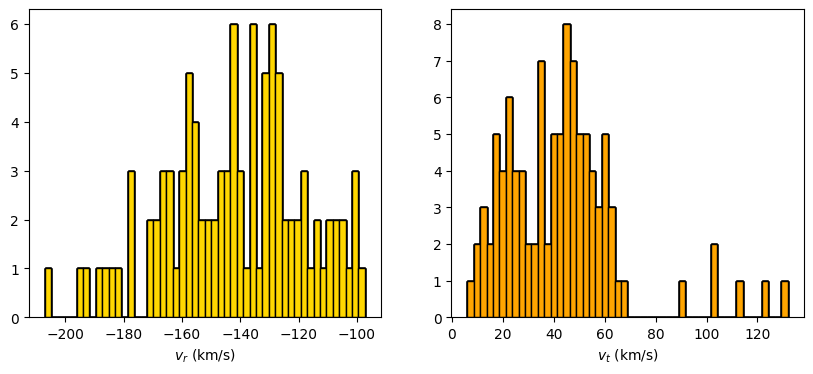

In [13]:
plt.figure(figsize = (10, 4)) 
plt.subplot(1,2,1)


for i in range (len(N_list)):
    plt.hist(N_vr_array[i], color='gold', ec='black', bins=50)
    plt.xlabel('$v_r$ (km/s)')

statistics(N_vr_array)

plt.subplot(1,2,2)

for i in range (len(N_list)):
    plt.hist(N_vt_array[i], ec='black', color='orange', bins=50)
    plt.xlabel('$v_t$ (km/s)')
statistics(N_vt_array)

2
-------------------------------------------------------------------------------------------
Variable: N_b_array
mean= 52.08676146705817
median= 34.428071176232535
standard deviation= 57.5561535214039
-1 sigma= 21.4721472530306
1 sigma= 43.98136968420373
3
-------------------------------------------------------------------------------------------
Variable: N_b_array
mean= 52.08676146705817
median= 34.428071176232535
standard deviation= 57.5561535214039
-1 sigma= 21.4721472530306
1 sigma= 43.98136968420373
4
-------------------------------------------------------------------------------------------
Variable: N_b_array
mean= 52.08676146705817
median= 34.428071176232535
standard deviation= 57.5561535214039
-1 sigma= 21.4721472530306
1 sigma= 43.98136968420373
5
-------------------------------------------------------------------------------------------
Variable: N_b_array
mean= 52.08676146705817
median= 34.428071176232535
standard deviation= 57.5561535214039
-1 sigma= 21.4721472530306
1 s

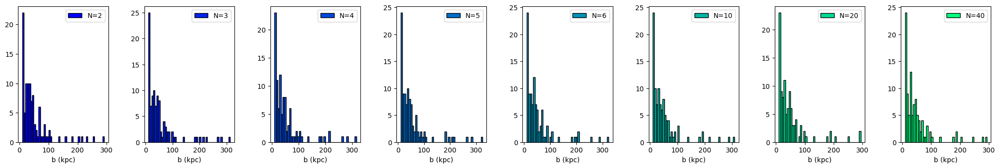

In [44]:
plt.figure(figsize = (25, 4)) 
colors = np.linspace(0, 1, len(N_list))

for i, color in zip(range (len(N_list)), colors):
  plt.subplot(1,len(N_list), i+1)
  plt.hist(N_b_array[i], ec ='black',bins=50, label='N='+str(N_list[i]), color=plt.cm.winter(color))

  plt.xlabel('b (kpc)')
  print(N_list[i])
  statistics(N_b_array)
  plt.legend()

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.2, top=0.9, wspace=0.4, hspace=1)

In [197]:
print (len(N_sum_mass_array[0]))
print (len(N_b_array[0]))

102
102


2
-------------------------------------------------------------------------------------------
Variable: N_t_array
mean= 3.320735294117651
median= 3.2600000000000002
standard deviation= 0.8001087233285753
-1 sigma= 0.6700000000000004
1 sigma= 0.7799999999999998
3
-------------------------------------------------------------------------------------------
Variable: N_t_array
mean= 3.320735294117651
median= 3.2600000000000002
standard deviation= 0.8001087233285753
-1 sigma= 0.6700000000000004
1 sigma= 0.7799999999999998
4
-------------------------------------------------------------------------------------------
Variable: N_t_array
mean= 3.320735294117651
median= 3.2600000000000002
standard deviation= 0.8001087233285753
-1 sigma= 0.6700000000000004
1 sigma= 0.7799999999999998
5
-------------------------------------------------------------------------------------------
Variable: N_t_array
mean= 3.320735294117651
median= 3.2600000000000002
standard deviation= 0.8001087233285753
-1 sigma= 0.6

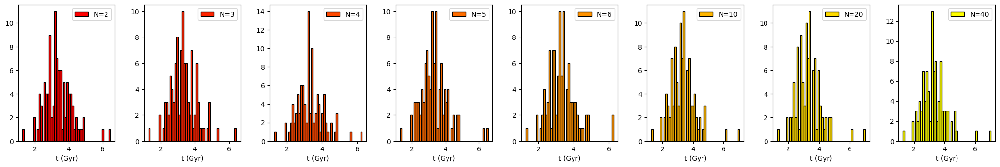

In [46]:
plt.figure(figsize = (25, 4)) 
colors = np.linspace(0, 1, len(N_list))

for i, color in zip(range (len(N_list)), colors):
  plt.subplot(1,len(N_list), i+1)
  plt.hist(N_t_array[i], ec ='black', bins=50, label= 'N='+str(N_list[i]), color= plt.cm.autumn(color))
  
  plt.xlabel('t (Gyr)')
  

  print(N_list[i])
  statistics(N_t_array)
  plt.legend()

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.2, top=0.9, wspace=0.3, hspace=0.8)

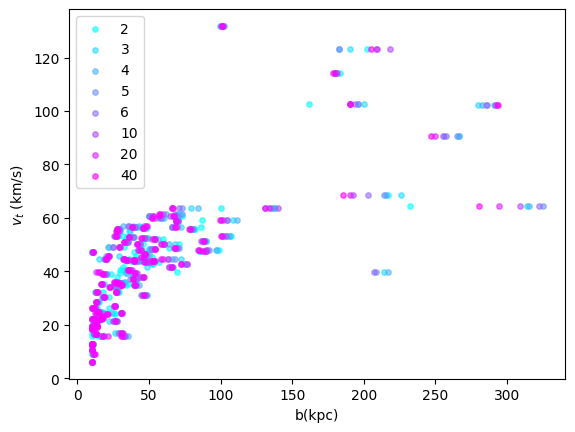

In [28]:
colors = np.linspace(0, 1, len(N_list))



for i, color in zip(range (len(N_list)), colors):
  plt.scatter(N_b_array[i], N_vt_array[i], label = N_list[i], s=15, alpha=.6, color=plt.cm.cool(color))
plt.xlabel('b(kpc)')
plt.ylabel('$v_t$ (km/s)')
plt.legend()

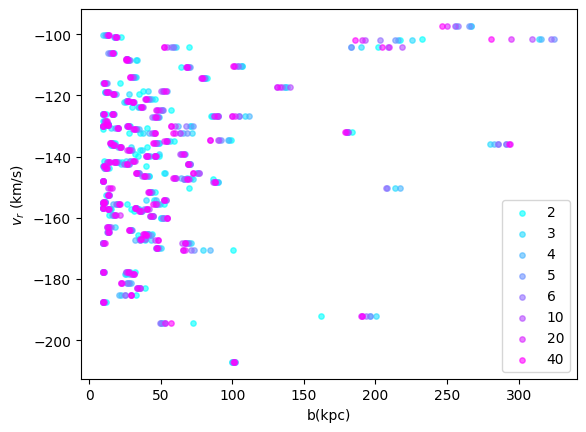

In [30]:
colors = np.linspace(0, 1, len(N_list))

#for i, color in zip(range (len(file_list)), colors):

for i, color in zip(range (len(N_list)), colors):
  plt.scatter(N_b_array[i], N_vr_array[i], label = N_list[i], s=15, alpha=.6, color=plt.cm.cool(color))
plt.xlabel('b(kpc)')
plt.ylabel('$v_r$ (km/s)')
plt.legend()

In [204]:
N_vt_nomerge=[]
for i in range (len(N_list)):
    for j in range(102) :
        if N_t_array[i,j] > 10 :
            N_vt_nomerge.append(N_vt_array[i,j])
            print (j, N_vt_array[i,j])


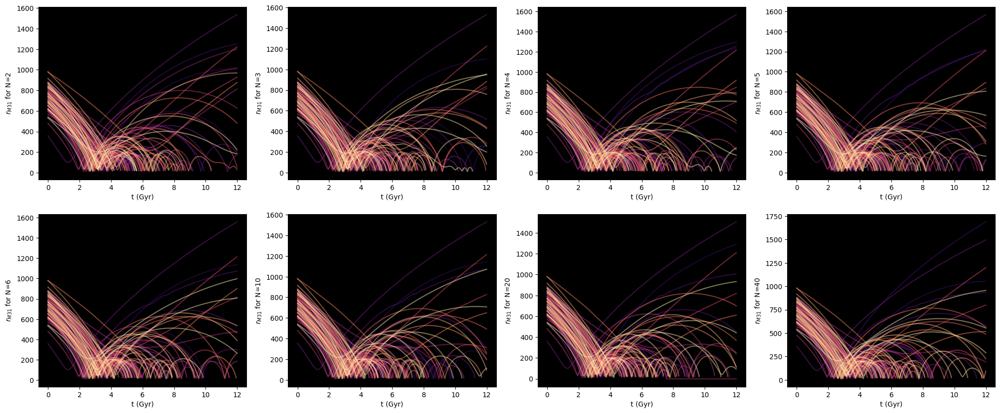

In [310]:
fig = plt.figure(figsize=(25, 10))

colors = np.linspace(0, 1, len(file_list))

for i, N_value in zip(range(1, len(N_list) + 1), N_list):
    ax= plt.subplot(2, 4, i)
    ax.set_facecolor("black")
    for j, color in zip(range(len(file_list)), colors):
        plt.plot(N_t_all_array[i-1, j][N_times_M31_array[i-1, j]], N_r_M31_array[i-1, j][N_times_M31_array[i-1, j]], color=plt.cm.magma(color), alpha=.5)
    
    
    plt.xlabel('t (Gyr)')
    plt.ylabel(f'$r_{{M31}}$ for N={N_value}')

plt.show()

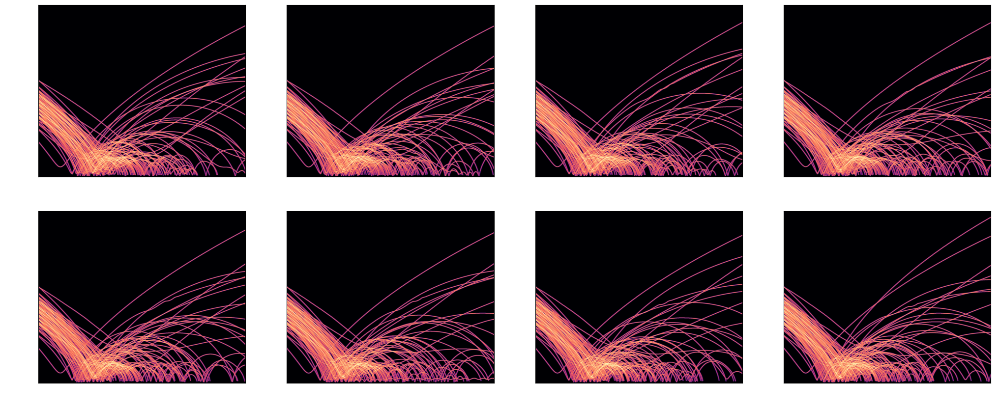

In [29]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))
fig.patch.set_facecolor('white')
fig.patch.set_alpha(0.0)
colors = np.linspace(0, 1, len(file_list))
plt.rcParams.update({'font.size':9})
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'

cmapgal = cm.magma
cmapgal.set_under('black')

for i, ax in enumerate(axs.flat):
    
    x = []
    y = []
    for j in range(len(file_list)):
        x.extend(N_t_all_array[i, j][N_times_M31_array[i, j]])
        y.extend(N_r_M31_array[i, j][N_times_M31_array[i, j]])

    xedges = np.linspace(0, 12, 1200)
    yedges = np.linspace(0, 1750, 1400)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    bins = (xedges, yedges)

    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=1)

    heatmap = heatmap ** 0.2
    heatmap = heatmap / np.percentile(heatmap, 99.98)
    ax.imshow(Image.fromarray(np.uint8(cmapgal(heatmap.T) * 255)), origin='lower', extent=extent, aspect='auto')

    ax.set_xlabel('t (Gyr)')
    ax.set_ylabel(f'$r_{{M31}}$ for N={N_list[i]}')
    

plt.show()

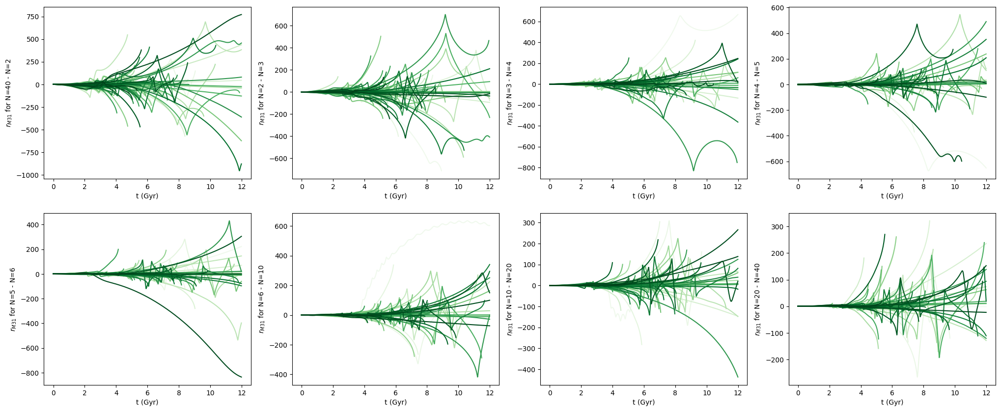

In [266]:
fig = plt.figure(figsize=(25, 10))

colors = np.linspace(0, 1, len(file_list))

for i, N_value in zip(range(1, len(N_list) + 1), N_list):
    plt.subplot(2, 4, i)
    
    for j, color in zip(range(len(file_list)), colors):

        
        indexes = list(set(N_times_M31_array[i-1,j]) & set(N_times_M31_array[i-2,j]))
        plt.plot(N_t_all_array[i-2,j][indexes],N_r_M31_array[i-2,j][indexes] - N_r_M31_array[i-1,j][indexes], color=plt.cm.Greens(color))
       
    
    plt.xlabel('t (Gyr)')
    plt.ylabel(f'$r_{{M31}}$ for N={N_list[i-2]} - N={N_list[i-1]} ')

plt.show()

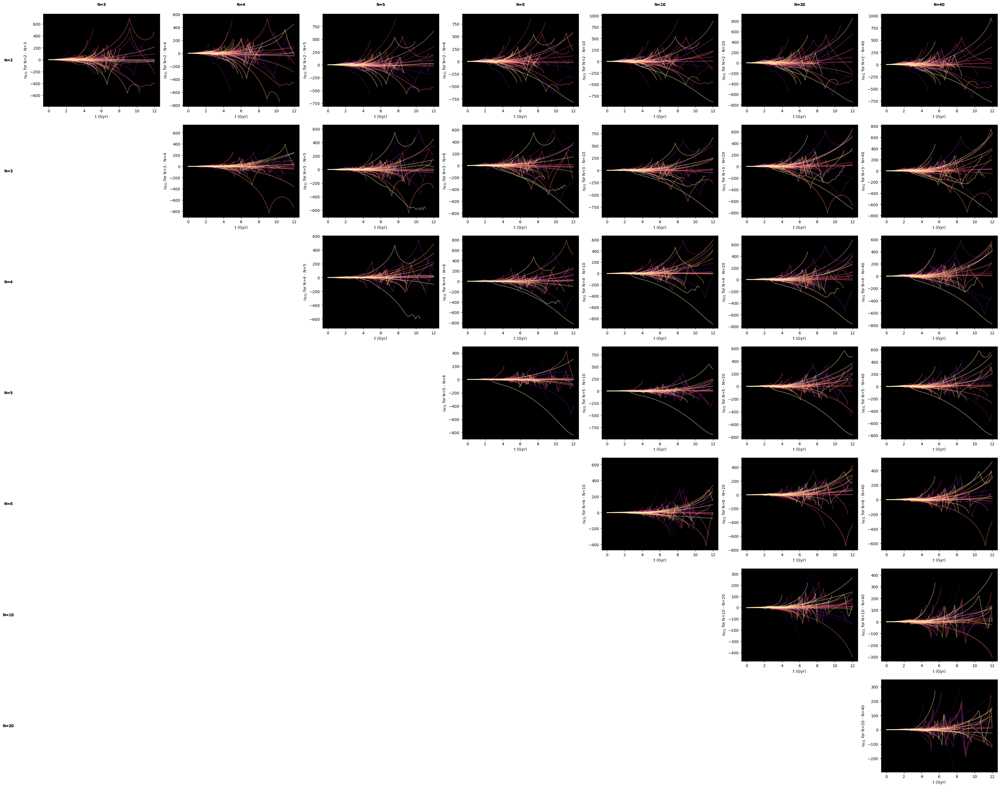

<Figure size 640x480 with 0 Axes>

In [311]:

fig = plt.figure(figsize=(50, 40))
for i in range(len(N_list)):
    for j in range(i+1, len(N_list)):  
        for k, color in zip(range(len(file_list)), colors):
            ax = plt.subplot(len(N_list), len(N_list), i*len(N_list) + j + 1)  
            
           
            indexes = list(set(N_times_M31_array[i, k]) & set(N_times_M31_array[j, k]))
            
           
            plt.plot(N_t_all_array[i, k][indexes], N_r_M31_array[i, k][indexes] - N_r_M31_array[j, k][indexes], color=plt.cm.magma(color), alpha=0.5)
            
            plt.xlabel('t (Gyr)')
            plt.ylabel(f'$r_{{M31}}$ for N={N_list[i]} - N={N_list[j]}')
            if i == 0:
                ax.text(0.5, 1.1, f'N={N_list[j]}', ha='center', va='center', transform=ax.transAxes)
            if j == len(N_list) - 1:
                ax.text(-7.5, 0.5, f'N={N_list[i]}', ha='center', va='center', transform=ax.transAxes)
            ax.set_facecolor("black")


plt.show()

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=1, hspace=0.3)

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(40, 40), dpi=800)

cmapgal= cm.magma
cmapgal.set_under('black')
x=[]
y=[] 

for i in range (0, len(file_list)):
    indexes = list(set(N_times_M31_array[3,i]) & set(N_times_M31_array[7,i]))
    x.extend(N_t_all_array[3,i][indexes])
    y.extend(N_r_M31_array[3,i][indexes] - N_r_M31_array[7,i][indexes])

xedges = np.linspace(0,10,4000)
yedges = np.linspace(-600,600,4000)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
bins = (xedges, yedges)

heatmap, xedges, yedges = np.histogram2d(x,y, bins=bins)
heatmap = gaussian_filter(heatmap, sigma=1)

heatmap = heatmap**.25

ax.imshow(Image.fromarray(np.uint8(cmapgal(heatmap.T)*255)), origin='lower', extent=extent, aspect='auto')
ax.set_axis_off()

plt.show()



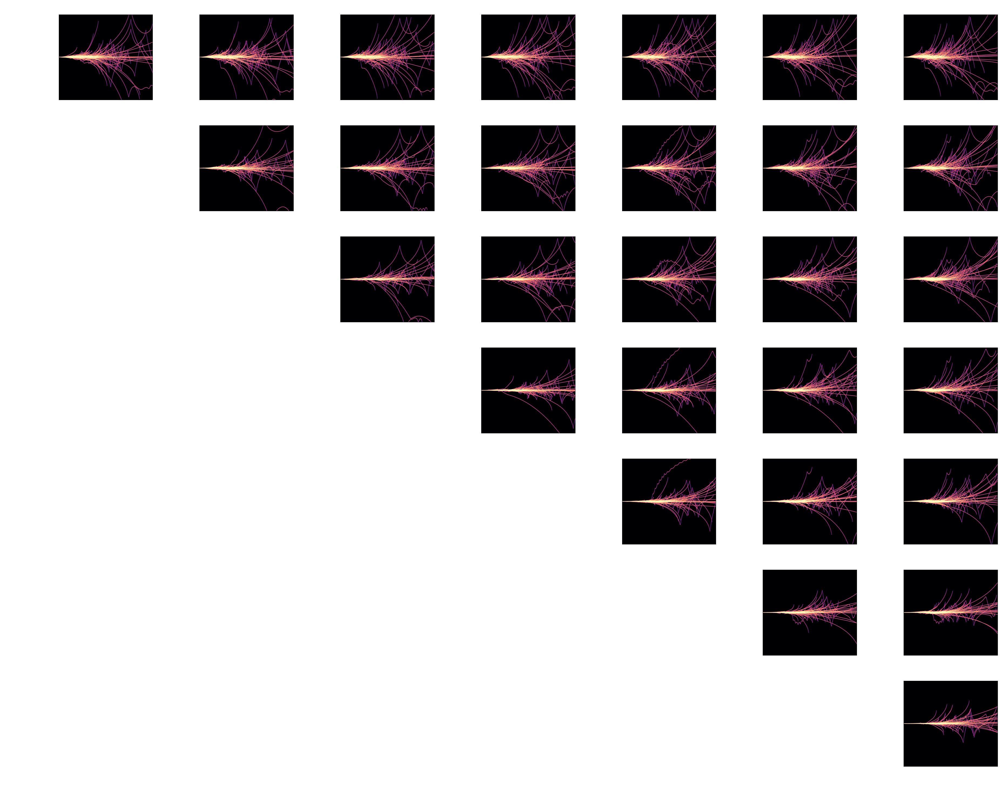

In [30]:
fig = plt.figure(figsize=(50, 40))
fig.patch.set_facecolor('white')
fig.patch.set_alpha(0.0)
colors = np.linspace(0, 1, len(file_list))
cmapgal = cm.magma
cmapgal.set_under('black')

plt.rcParams.update({'font.size': 17})
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'


xedges = np.linspace(0,12,1200)
yedges = np.linspace(-600,600,1200)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
bins = (xedges, yedges)


for i in range(len(N_list)):
    for j in range(i+1, len(N_list)): 

        ax = plt.subplot(len(N_list), len(N_list), i*len(N_list) + j + 1) 
        x=[]
        y=[] 
         
        for k in range(len(file_list)):
           
            indexes = list(set(N_times_M31_array[i, k]) & set(N_times_M31_array[j, k]))
            x.extend(N_t_all_array[i,k][indexes])
            y.extend(N_r_M31_array[i,k][indexes] - N_r_M31_array[j,k][indexes])

        if i == 0:
            ax.text(0.5, 1.1, f'N={N_list[j]}', ha='center', va='center', transform=ax.transAxes)
        if j == len(N_list) - 1:
            ax.text(-9.5, 0.5, f'N={N_list[i]}', ha='center', va='center', transform=ax.transAxes)

        
        heatmap, xedges, yedges = np.histogram2d(x,y, bins=bins)
        heatmap = gaussian_filter(heatmap, sigma=1)
        heatmap = heatmap**.25
        ax.imshow(Image.fromarray(np.uint8(cmapgal(heatmap.T)*255)), origin='lower', extent=extent, aspect='auto')

    
        plt.xlabel('t (Gyr)')
        plt.ylabel(f'$r_{{M31}}$ for N={N_list[i]} - N={N_list[j]}')
         

plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.5, hspace=0.3)

plt.show()

Text(0.5, 0, 'b (kpc)')

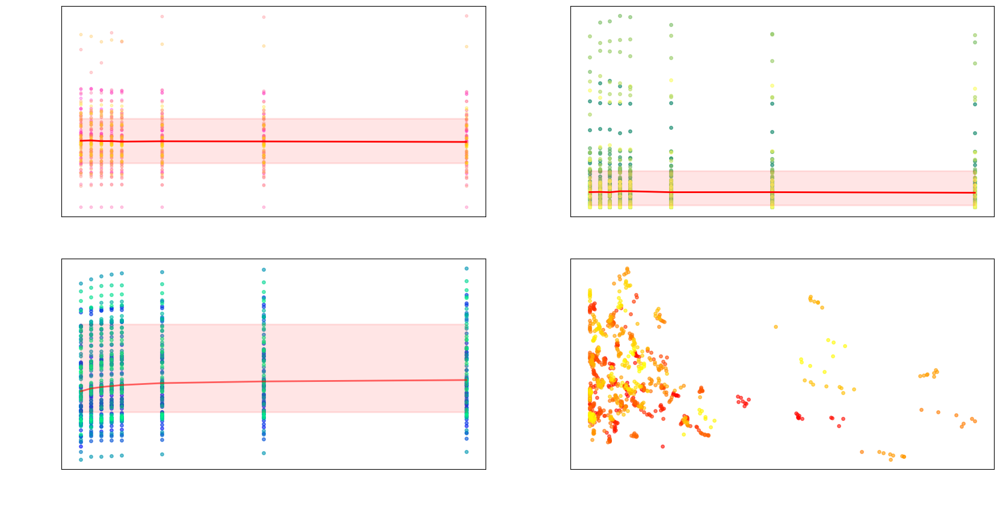

In [31]:
fig = plt.figure(figsize=(20, 10))

colors = np.linspace(0, 1, len(file_list))

plt.subplot(2,2,1)

for i, color in zip(range (len(file_list)), colors):
    plt.scatter( N_list, N_t_array[:,i], s=10, alpha=.3, color=plt.cm.spring(color))

medians = []
for j in range(8):
    median_t = np.median(N_t_array[j,:])
    medians.append(median_t)
    plus1 = np.percentile(N_t_array[j,:], 84)
    minus1 = np.percentile(N_t_array[j,:], 16)

plt.plot(N_list, medians, lw=2, c='red' )
plt.fill_between(N_list, plus1, minus1, lw=2, alpha=.1, color='red' )

plt.ylabel('t (Gyr)')
plt.xlabel('Number of Galaxies')

plt.subplot(2,2,2)

for i, color in zip(range (len(file_list)), colors):
    plt.scatter(N_list,N_b_array[:,i], alpha=.6, s=15, color=plt.cm.summer(color))

medians = []
for j in range(8):
    median = np.median(N_b_array[j,:])
    medians.append(median)
    plus1 = np.percentile(N_b_array[j,:], 84)
    minus1 = np.percentile(N_b_array[j,:], 16)

plt.plot(N_list, medians, lw=2, c='red' )
plt.fill_between(N_list, plus1, minus1, lw=2, alpha=.1, color='red' )


plt.ylabel('b (kpc)')
plt.xlabel('Number of Galaxies')

plt.subplot(2,2,3)

for i, color in zip(range (len(file_list)), colors):
    points =plt.scatter( N_list, N_sum_mass_array[:,i], s=15, alpha=.6, color=plt.cm.winter(color))

medians = []
for j in range(8):
    median = np.median(N_sum_mass_array[j,:])
    medians.append(median)
    plus1 = np.percentile(N_sum_mass_array[j,:], 84)
    minus1 = np.percentile(N_sum_mass_array[j,:], 16)

plt.plot(N_list, medians, lw=2, c='red', alpha=.6  )
plt.fill_between(N_list, plus1, minus1, lw=2, alpha=.1, color='red' )

plt.ylabel('Total of masses ($10^{10} M_{\odot}$)')
plt.xlabel('Number of Galaxies')

plt.subplot(2,2,4)

for i, color in zip(range (len(file_list)), colors):
    plt.scatter(N_b_array[:,i], N_sum_mass_array[:,i], s=15, alpha=.6, color=plt.cm.autumn(color))

plt.ylabel('Total of masses ($10^{10} M_{\odot}$)')
plt.xlabel('b (kpc)')
